In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

import sys
sys.path.append('../')

import utils
from utils import ax_rocs, plot_rocs, rocs_models
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
LOCAL_PC = False
root_dir = "/mnt/w" if LOCAL_PC else "/data/bodyct"
EXPERIMENT_DIR = f"{root_dir}/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst-preds"

NLST_PREDS_LOCAL = "/mnt/c/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = NLST_PREDS_LOCAL ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f'{NLST_PREDS}/nlst_demo_v1_w4preds.csv')
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Data columns (total 89 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PatientID            16077 non-null  int64  
 1   StudyDate            16077 non-null  int64  
 2   SeriesInstanceUID    16077 non-null  object 
 3   CoordX               16077 non-null  float64
 4   CoordY               16077 non-null  float64
 5   CoordZ               16077 non-null  float64
 6   LesionID             16077 non-null  int64  
 7   NoduleType           16077 non-null  object 
 8   Spiculation          16077 non-null  bool   
 9   Diameter [mm]        16077 non-null  float64
 10  Age                  16077 non-null  int64  
 11  Gender               16077 non-null  int64  
 12  FamilyHistoryLungCa  16077 non-null  bool   
 13  Emphysema            16077 non-null  bool   
 14  NoduleInUpperLung    16077 non-null  bool   
 15  NoduleCounts         16077 non-null 

In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v1_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas": "Thijmen_mean",
    "de Haas local": "Thijmen_local",
    # "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

### Convert to scan-level

In [5]:
nlst_preds_nodule.nunique()[0:30]

PatientID               5282
StudyDate                  3
SeriesInstanceUID      10183
CoordX                 11867
CoordY                 13071
CoordZ                 13528
LesionID                  18
NoduleType                 7
Spiculation                2
Diameter [mm]            368
Age                       23
Gender                     2
FamilyHistoryLungCa        2
Emphysema                  2
NoduleInUpperLung          2
NoduleCounts              12
SCT_EPI_LOC                7
xie_gc_gclobe150           6
loclup                     2
locrup                     2
PanCan2b               14187
label                      2
DL                     16068
NoduleID               10024
AnnotationID           16077
Thijmen_mean            3240
height                    28
weight                   216
pkyr                     284
smokeage                  33
dtype: int64

In [6]:
nodule_specific_cols = ['NoduleType', 'Spiculation', 'CoordX', 'CoordY', 'CoordZ', 'Diameter [mm]', 'NoduleID', 'AnnotationID']
nlst_preds = nlst_preds_nodule.drop(nodule_specific_cols, axis=1)
nlst_preds.nunique()[0:30]

PatientID               5282
StudyDate                  3
SeriesInstanceUID      10183
LesionID                  18
Age                       23
Gender                     2
FamilyHistoryLungCa        2
Emphysema                  2
NoduleInUpperLung          2
NoduleCounts              12
SCT_EPI_LOC                7
xie_gc_gclobe150           6
loclup                     2
locrup                     2
PanCan2b               14187
label                      2
DL                     16068
Thijmen_mean            3240
height                    28
weight                   216
pkyr                     284
smokeage                  33
smokeday                  42
smokeyr                   52
marital                    5
educat                     7
race                       6
ethnic                     2
cigar                      2
cigsmok                    2
dtype: int64

In [7]:
models = list(MODEL_TO_COL.values())
for m in models:
    nlst_preds[m] = nlst_preds.groupby('SeriesInstanceUID')[m].transform(max)

nlst_preds.nunique().sort_values(ascending=False)

Thijmen_local        10183
SeriesInstanceUID    10183
DL                   10181
PanCan2b              9379
PatientID             5282
                     ...  
wrkweld                  2
wrknomask                2
diagadas                 2
wrkfire                  2
cancpanc                 1
Length: 81, dtype: int64

In [8]:
nlst_preds = nlst_preds.drop_duplicates(['SeriesInstanceUID'], ignore_index=True)
nlst_preds = nlst_preds[~nlst_preds['Thijmen_mean'].isna()]
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2062 entries, 0 to 10178
Data columns (total 81 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PatientID            2062 non-null   int64  
 1   StudyDate            2062 non-null   int64  
 2   SeriesInstanceUID    2062 non-null   object 
 3   LesionID             2062 non-null   int64  
 4   Age                  2062 non-null   int64  
 5   Gender               2062 non-null   int64  
 6   FamilyHistoryLungCa  2062 non-null   bool   
 7   Emphysema            2062 non-null   bool   
 8   NoduleInUpperLung    2062 non-null   bool   
 9   NoduleCounts         2062 non-null   int64  
 10  SCT_EPI_LOC          1957 non-null   float64
 11  xie_gc_gclobe150     105 non-null    float64
 12  loclup               265 non-null    float64
 13  locrup               265 non-null    float64
 14  PanCan2b             2062 non-null   float64
 15  label                2062 non-null   int64

In [9]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas": "Thijmen_mean",
    # "de Haas local": "Thijmen_local",
    # "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

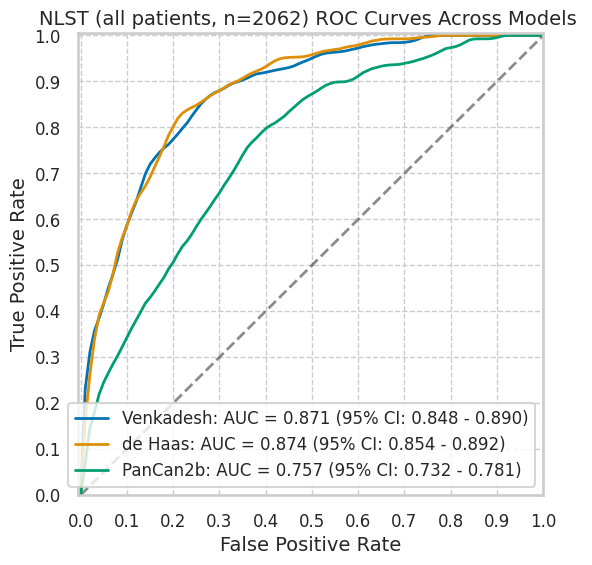

In [10]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [11]:
utils.stats_from_cm(*utils.cm_with_thres(nlst_preds))

{'num': 2062,
 'tp': 249,
 'fp': 837,
 'tn': 960,
 'fn': 16,
 'tpr': 0.939622641509434,
 'fpr': 0.4657762938230384,
 'fnr': 0.06037735849056604,
 'tnr': 0.5342237061769616,
 'ppv': 0.2292817679558011,
 'npv': 0.9836065573770492,
 'fdr': 0.7707182320441989,
 'for': 0.01639344262295082,
 'acc': 0.5863239573229874}

## Plot results by category

In [12]:
def plot_by_category(df, cat, models=MODEL_TO_COL.keys()):
    groups = df.groupby(cat) 
    df_catinfo, plot_roc = utils.info_by_splits(groups)
    display(df_catinfo)

    if not plot_roc:
        print("Not plotting ROC since there are zero values for malignant or benign nodules :(")
        return df_catinfo

    rocs = {}
    for m in models:
        rocs[m], df_perf = utils.perf_by_splits(groups, pred_col=MODEL_TO_COL[m])
        print(m)
        display(df_perf)

    fig, ax = plt.subplots(1, len(models), figsize=(6.5*len(models) - 0.5, 6))
    fig.suptitle(f"Model Performance Split By {cat}")
    for i, m in enumerate(models):
        utils.ax_rocs(ax[i], rocs[m], title=m)
    plt.show()

    return df_catinfo        

### Included columns (from predictions)

In [13]:
# pred_only_cols = ["NoduleInUpperLung", "Spiculation", "NoduleType"]
# for c in pred_only_cols:
#     print(c)
#     plot_by_category(nlst_preds, c)

### Demographics

marital


,num,pct,num_mal,pct_mal
1.0,78,3.786408,5,6.410256
2.0,1388,67.378641,175,12.608069
3.0,205,9.951456,34,16.585366
4.0,31,1.504854,8,25.806452
5.0,358,17.378641,43,12.011173


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,78,3,36,37,2,0.600000,0.493151,0.400000,0.506849,0.076923,0.948718,0.923077,0.051282,0.512821
2.0,1388,165,551,662,10,0.942857,0.454246,0.057143,0.545754,0.230447,0.985119,0.769553,0.014881,0.595821
3.0,205,33,86,85,1,0.970588,0.502924,0.029412,0.497076,0.277311,0.988372,0.722689,0.011628,0.575610
4.0,31,7,9,14,1,0.875000,0.391304,0.125000,0.608696,0.437500,0.933333,0.562500,0.066667,0.677419
5.0,358,41,154,161,2,0.953488,0.488889,0.046512,0.511111,0.210256,0.987730,0.789744,0.012270,0.564246


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,78,5,39,34,0,1.000000,0.534247,0.000000,0.465753,0.113636,1.000000,0.886364,0.000000,0.500000
2.0,1388,171,657,556,4,0.977143,0.541632,0.022857,0.458368,0.206522,0.992857,0.793478,0.007143,0.523775
3.0,205,34,105,66,0,1.000000,0.614035,0.000000,0.385965,0.244604,1.000000,0.755396,0.000000,0.487805
4.0,31,7,15,8,1,0.875000,0.652174,0.125000,0.347826,0.318182,0.888889,0.681818,0.111111,0.483871
5.0,358,41,201,114,2,0.953488,0.638095,0.046512,0.361905,0.169421,0.982759,0.830579,0.017241,0.432961


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,78,5,52,21,0,1.000000,0.712329,0.000000,0.287671,0.087719,1.000000,0.912281,0.000000,0.333333
2.0,1388,160,674,539,15,0.914286,0.555647,0.085714,0.444353,0.191847,0.972924,0.808153,0.027076,0.503602
3.0,205,30,118,53,4,0.882353,0.690058,0.117647,0.309942,0.202703,0.929825,0.797297,0.070175,0.404878
4.0,31,7,13,10,1,0.875000,0.565217,0.125000,0.434783,0.350000,0.909091,0.650000,0.090909,0.548387
5.0,358,38,207,108,5,0.883721,0.657143,0.116279,0.342857,0.155102,0.955752,0.844898,0.044248,0.407821


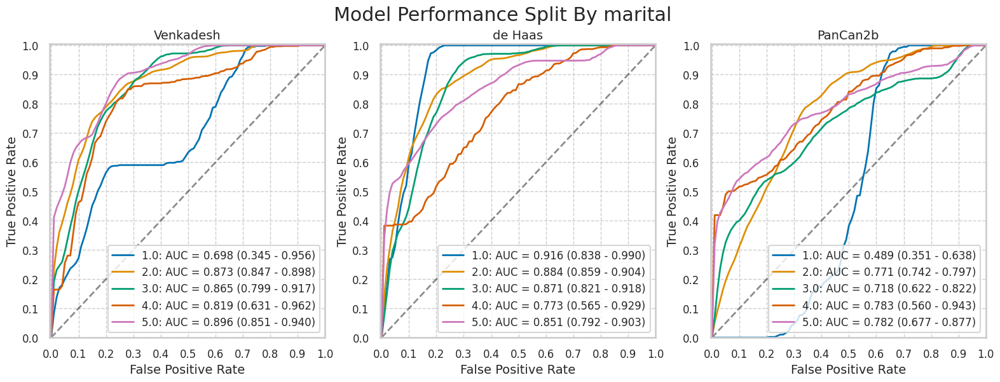

educat


,num,pct,num_mal,pct_mal
1.0,42,2.063882,7,16.666667
2.0,117,5.749386,10,8.547009
3.0,537,26.388206,76,14.152700
4.0,269,13.218673,33,12.267658
5.0,429,21.081081,63,14.685315
6.0,332,16.314496,41,12.349398
7.0,309,15.184275,30,9.708738


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,42,5,21,14,2,0.714286,0.600000,0.285714,0.400000,0.192308,0.875000,0.807692,0.125000,0.452381
2.0,117,10,56,51,0,1.000000,0.523364,0.000000,0.476636,0.151515,1.000000,0.848485,0.000000,0.521368
3.0,537,71,220,241,5,0.934211,0.477223,0.065789,0.522777,0.243986,0.979675,0.756014,0.020325,0.581006
4.0,269,32,115,121,1,0.969697,0.487288,0.030303,0.512712,0.217687,0.991803,0.782313,0.008197,0.568773
5.0,429,59,158,208,4,0.936508,0.431694,0.063492,0.568306,0.271889,0.981132,0.728111,0.018868,0.622378
6.0,332,39,123,168,2,0.951220,0.422680,0.048780,0.577320,0.240741,0.988235,0.759259,0.011765,0.623494
7.0,309,28,131,148,2,0.933333,0.469534,0.066667,0.530466,0.176101,0.986667,0.823899,0.013333,0.569579


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,42,7,25,10,0,1.000000,0.714286,0.000000,0.285714,0.218750,1.000000,0.781250,0.000000,0.404762
2.0,117,10,62,45,0,1.000000,0.579439,0.000000,0.420561,0.138889,1.000000,0.861111,0.000000,0.470085
3.0,537,75,266,195,1,0.986842,0.577007,0.013158,0.422993,0.219941,0.994898,0.780059,0.005102,0.502793
4.0,269,32,130,106,1,0.969697,0.550847,0.030303,0.449153,0.197531,0.990654,0.802469,0.009346,0.513011
5.0,429,61,186,180,2,0.968254,0.508197,0.031746,0.491803,0.246964,0.989011,0.753036,0.010989,0.561772
6.0,332,38,167,124,3,0.926829,0.573883,0.073171,0.426117,0.185366,0.976378,0.814634,0.023622,0.487952
7.0,309,30,168,111,0,1.000000,0.602151,0.000000,0.397849,0.151515,1.000000,0.848485,0.000000,0.456311


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,42,7,22,13,0,1.000000,0.628571,0.000000,0.371429,0.241379,1.000000,0.758621,0.000000,0.476190
2.0,117,9,73,34,1,0.900000,0.682243,0.100000,0.317757,0.109756,0.971429,0.890244,0.028571,0.367521
3.0,537,70,273,188,6,0.921053,0.592191,0.078947,0.407809,0.204082,0.969072,0.795918,0.030928,0.480447
4.0,269,29,159,77,4,0.878788,0.673729,0.121212,0.326271,0.154255,0.950617,0.845745,0.049383,0.394052
5.0,429,55,209,157,8,0.873016,0.571038,0.126984,0.428962,0.208333,0.951515,0.791667,0.048485,0.494172
6.0,332,39,152,139,2,0.951220,0.522337,0.048780,0.477663,0.204188,0.985816,0.795812,0.014184,0.536145
7.0,309,27,161,118,3,0.900000,0.577061,0.100000,0.422939,0.143617,0.975207,0.856383,0.024793,0.469256


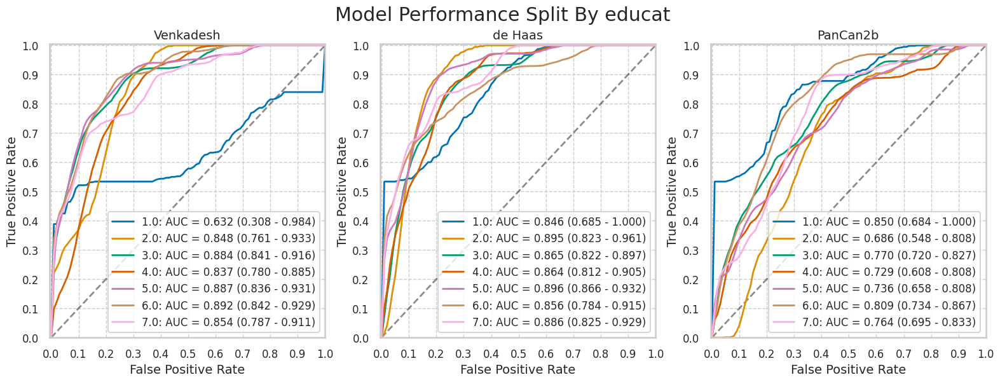

race


,num,pct,num_mal,pct_mal
1.0,1933,93.880525,241,12.467667
2.0,64,3.108305,12,18.750000
3.0,23,1.117047,3,13.043478
4.0,15,0.728509,5,33.333333
5.0,8,0.388538,1,12.500000
6.0,16,0.777076,3,18.750000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,1933,228,773,919,13,0.946058,0.456856,0.053942,0.543144,0.227772,0.986052,0.772228,0.013948,0.593378
2.0,64,9,27,25,3,0.750000,0.519231,0.250000,0.480769,0.250000,0.892857,0.750000,0.107143,0.531250
3.0,23,3,17,3,0,1.000000,0.850000,0.000000,0.150000,0.150000,1.000000,0.850000,0.000000,0.260870
4.0,15,5,7,3,0,1.000000,0.700000,0.000000,0.300000,0.416667,1.000000,0.583333,0.000000,0.533333
5.0,8,1,4,3,0,1.000000,0.571429,0.000000,0.428571,0.200000,1.000000,0.800000,0.000000,0.500000
6.0,16,3,8,5,0,1.000000,0.615385,0.000000,0.384615,0.272727,1.000000,0.727273,0.000000,0.500000


de Haas


/mnt/c/Users/shaur/github/thesis-repo-xps/utils.py:112: RuntimeWarning: invalid value encountered in scalar divide
  "npv": tn / (tn + fn), ## negative predictive value
/mnt/c/Users/shaur/github/thesis-repo-xps/utils.py:114: RuntimeWarning: invalid value encountered in scalar divide
  "for": fn / (fn + tn), ## False omission rate,


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,1933,234,950,742,7,0.970954,0.561466,0.029046,0.438534,0.197635,0.990654,0.802365,0.009346,0.504915
2.0,64,12,32,20,0,1.000000,0.615385,0.000000,0.384615,0.272727,1.000000,0.727273,0.000000,0.500000
3.0,23,3,11,9,0,1.000000,0.550000,0.000000,0.450000,0.214286,1.000000,0.785714,0.000000,0.521739
4.0,15,5,7,3,0,1.000000,0.700000,0.000000,0.300000,0.416667,1.000000,0.583333,0.000000,0.533333
5.0,8,1,7,0,0,1.000000,1.000000,0.000000,0.000000,0.125000,NaN,0.875000,NaN,0.125000
6.0,16,3,8,5,0,1.000000,0.615385,0.000000,0.384615,0.272727,1.000000,0.727273,0.000000,0.500000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,1933,220,990,702,21,0.912863,0.585106,0.087137,0.414894,0.181818,0.970954,0.818182,0.029046,0.476979
2.0,64,10,35,17,2,0.833333,0.673077,0.166667,0.326923,0.222222,0.894737,0.777778,0.105263,0.421875
3.0,23,2,16,4,1,0.666667,0.800000,0.333333,0.200000,0.111111,0.800000,0.888889,0.200000,0.260870
4.0,15,4,7,3,1,0.800000,0.700000,0.200000,0.300000,0.363636,0.750000,0.636364,0.250000,0.466667
5.0,8,1,3,4,0,1.000000,0.428571,0.000000,0.571429,0.250000,1.000000,0.750000,0.000000,0.625000
6.0,16,3,11,2,0,1.000000,0.846154,0.000000,0.153846,0.214286,1.000000,0.785714,0.000000,0.312500


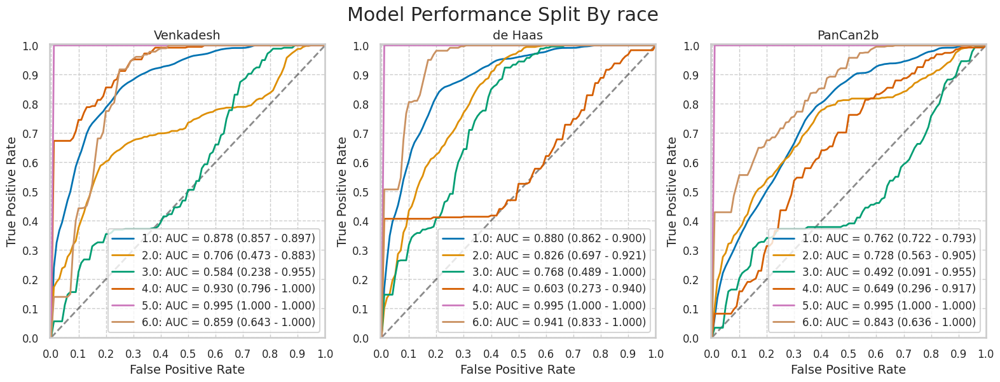

ethnic


,num,pct,num_mal,pct_mal
1.0,20,0.974659,3,15.00000
2.0,2032,99.025341,258,12.69685


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,20,3,10,7,0,1.000000,0.588235,0.000000,0.411765,0.230769,1.000000,0.769231,0.000000,0.500000
2.0,2032,242,821,953,16,0.937984,0.462796,0.062016,0.537204,0.227658,0.983488,0.772342,0.016512,0.588091


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,20,3,16,1,0,1.000000,0.941176,0.000000,0.058824,0.157895,1.00000,0.842105,0.00000,0.200000
2.0,2032,251,998,776,7,0.972868,0.562570,0.027132,0.437430,0.200961,0.99106,0.799039,0.00894,0.505413


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,20,3,11,6,0,1.000000,0.647059,0.000000,0.352941,0.214286,1.000000,0.785714,0.000000,0.450000
2.0,2032,233,1048,726,25,0.903101,0.590755,0.096899,0.409245,0.181889,0.966711,0.818111,0.033289,0.471949


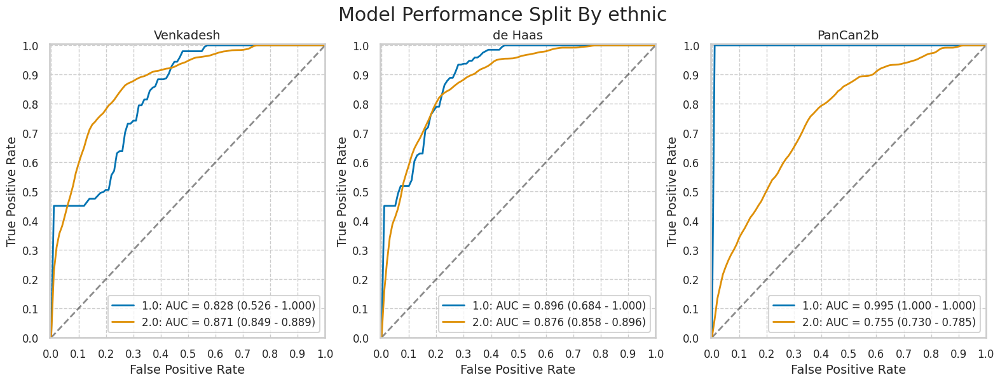

Gender


,num,pct,num_mal,pct_mal
1,1179,57.177498,173,14.673452
2,883,42.822502,92,10.419026


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1179,165,465,541,8,0.953757,0.462227,0.046243,0.537773,0.261905,0.985428,0.738095,0.014572,0.598813
2,883,84,372,419,8,0.913043,0.470291,0.086957,0.529709,0.184211,0.981265,0.815789,0.018735,0.569649


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1179,170,530,476,3,0.982659,0.526839,0.017341,0.473161,0.242857,0.993737,0.757143,0.006263,0.547922
2,883,88,488,303,4,0.956522,0.616941,0.043478,0.383059,0.152778,0.986971,0.847222,0.013029,0.442809


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1179,158,516,490,15,0.913295,0.512922,0.086705,0.487078,0.234421,0.970297,0.765579,0.029703,0.549618
2,883,82,549,242,10,0.891304,0.694058,0.108696,0.305942,0.129952,0.960317,0.870048,0.039683,0.366931


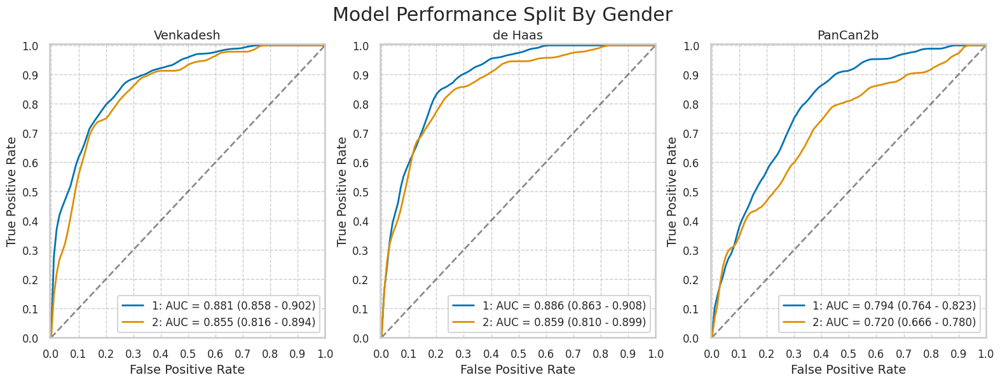

In [14]:
for cat in nlst_democols['cat']['demo']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Smoking

cigar


,num,pct,num_mal,pct_mal
0.0,1671,81.313869,214,12.806703
1.0,384,18.686131,50,13.020833


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1671,201,699,758,13,0.939252,0.479753,0.060748,0.520247,0.223333,0.983139,0.776667,0.016861,0.573908
1.0,384,47,137,197,3,0.940000,0.410180,0.060000,0.589820,0.255435,0.985000,0.744565,0.015000,0.635417


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1671,210,850,607,4,0.981308,0.583391,0.018692,0.416609,0.198113,0.993453,0.801887,0.006547,0.488929
1.0,384,47,166,168,3,0.940000,0.497006,0.060000,0.502994,0.220657,0.982456,0.779343,0.017544,0.559896


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1671,191,893,564,23,0.892523,0.612903,0.107477,0.387097,0.176199,0.960818,0.823801,0.039182,0.451825
1.0,384,48,171,163,2,0.960000,0.511976,0.040000,0.488024,0.219178,0.987879,0.780822,0.012121,0.549479


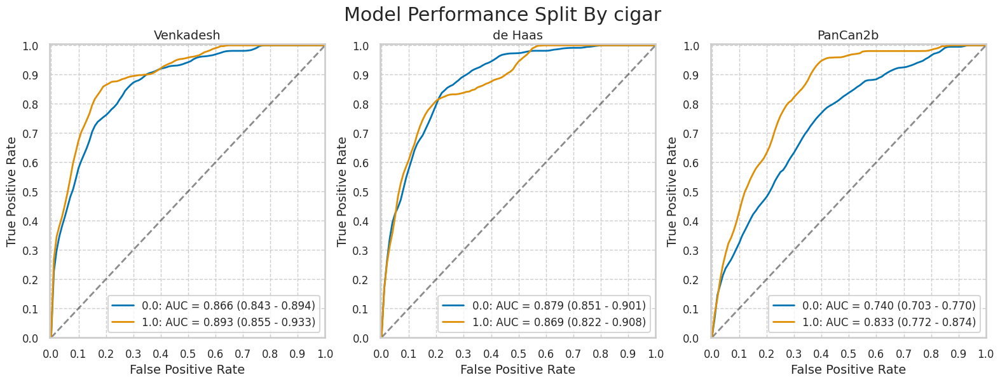

cigsmok


,num,pct,num_mal,pct_mal
0,1002,48.593598,98,9.780439
1,1060,51.406402,167,15.754717


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,1002,93,416,488,5,0.948980,0.460177,0.051020,0.539823,0.182711,0.989858,0.817289,0.010142,0.579840
1,1060,156,421,472,11,0.934132,0.471445,0.065868,0.528555,0.270364,0.977226,0.729636,0.022774,0.592453


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,1002,94,477,427,4,0.959184,0.527655,0.040816,0.472345,0.164623,0.990719,0.835377,0.009281,0.519960
1,1060,164,541,352,3,0.982036,0.605823,0.017964,0.394177,0.232624,0.991549,0.767376,0.008451,0.486792


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,1002,91,543,361,7,0.928571,0.600664,0.071429,0.399336,0.143533,0.980978,0.856467,0.019022,0.451098
1,1060,149,522,371,18,0.892216,0.584546,0.107784,0.415454,0.222057,0.953728,0.777943,0.046272,0.490566


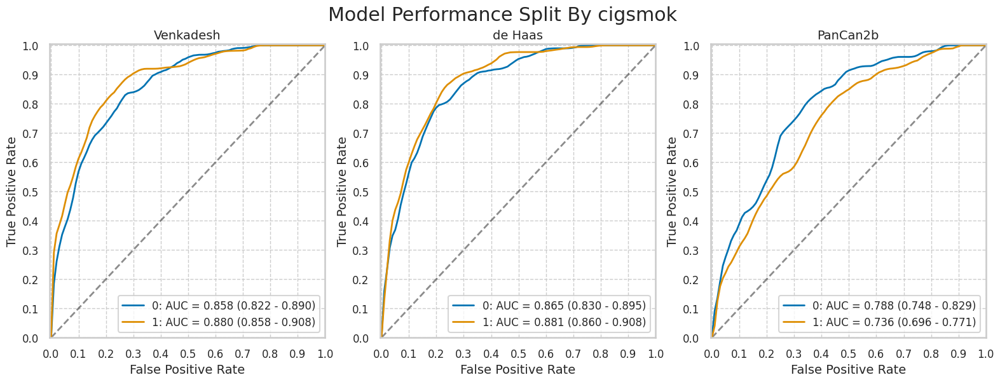

pipe


,num,pct,num_mal,pct_mal
0.0,1594,77.718186,194,12.170640
1.0,457,22.281814,70,15.317287


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1594,179,667,733,15,0.922680,0.476429,0.077320,0.523571,0.211584,0.979947,0.788416,0.020053,0.572146
1.0,457,69,165,222,1,0.985714,0.426357,0.014286,0.573643,0.294872,0.995516,0.705128,0.004484,0.636761


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1594,188,811,589,6,0.969072,0.579286,0.030928,0.420714,0.188188,0.989916,0.811812,0.010084,0.487453
1.0,457,69,201,186,1,0.985714,0.519380,0.014286,0.480620,0.255556,0.994652,0.744444,0.005348,0.557987


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1594,176,858,542,18,0.907216,0.612857,0.092784,0.387143,0.170213,0.967857,0.829787,0.032143,0.450439
1.0,457,63,203,184,7,0.900000,0.524548,0.100000,0.475452,0.236842,0.963351,0.763158,0.036649,0.540481


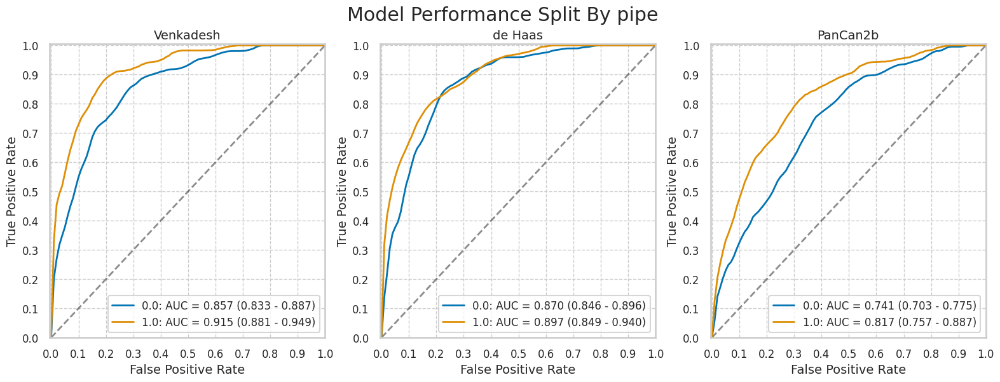

smokelive


,num,pct,num_mal,pct_mal
0.0,259,12.603406,27,10.424710
1.0,1796,87.396594,237,13.195991


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,259,25,105,127,2,0.925926,0.452586,0.074074,0.547414,0.192308,0.984496,0.807692,0.015504,0.586873
1.0,1796,223,730,829,14,0.940928,0.468249,0.059072,0.531751,0.233998,0.983393,0.766002,0.016607,0.585746


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,259,26,128,104,1,0.962963,0.551724,0.037037,0.448276,0.168831,0.990476,0.831169,0.009524,0.501931
1.0,1796,231,888,671,6,0.974684,0.569596,0.025316,0.430404,0.206434,0.991137,0.793566,0.008863,0.502227


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,259,26,126,106,1,0.962963,0.543103,0.037037,0.456897,0.171053,0.990654,0.828947,0.009346,0.509653
1.0,1796,213,937,622,24,0.898734,0.601026,0.101266,0.398974,0.185217,0.962848,0.814783,0.037152,0.464922


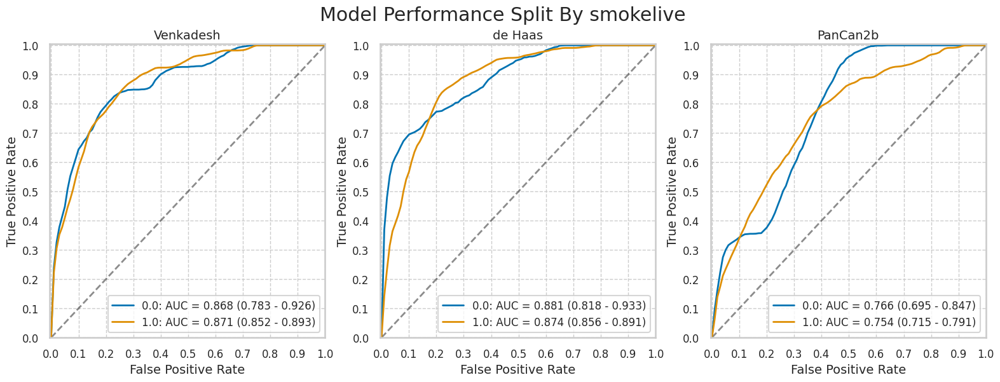

smokework


,num,pct,num_mal,pct_mal
0.0,270,13.17716,33,12.222222
1.0,1779,86.82284,232,13.041034


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,270,31,107,130,2,0.939394,0.451477,0.060606,0.548523,0.224638,0.984848,0.775362,0.015152,0.596296
1.0,1779,218,725,822,14,0.939655,0.468649,0.060345,0.531351,0.231177,0.983254,0.768823,0.016746,0.584598


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,270,32,127,110,1,0.969697,0.535865,0.030303,0.464135,0.201258,0.990991,0.798742,0.009009,0.525926
1.0,1779,226,886,661,6,0.974138,0.572721,0.025862,0.427279,0.203237,0.991004,0.796763,0.008996,0.498595


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,270,26,155,82,7,0.787879,0.654008,0.212121,0.345992,0.143646,0.921348,0.856354,0.078652,0.400000
1.0,1779,214,903,644,18,0.922414,0.583710,0.077586,0.416290,0.191585,0.972810,0.808415,0.027190,0.482293


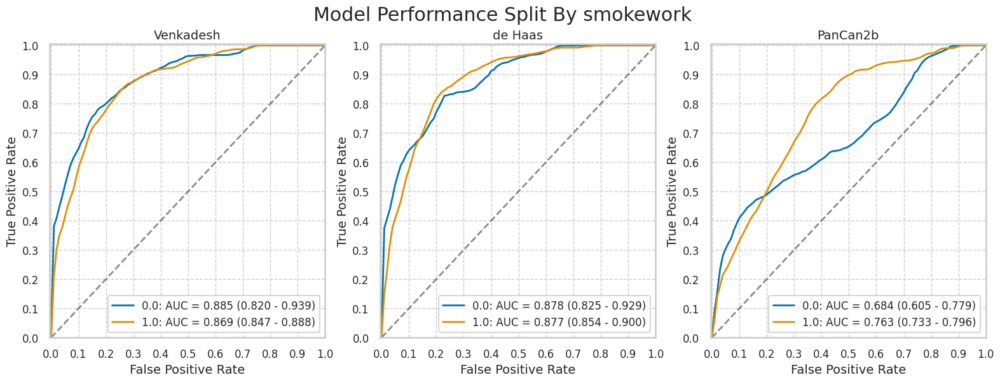

In [15]:
for cat in nlst_democols['cat']['smoke']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Work history

wrkasbe


,num,pct,num_mal,pct_mal
0.0,1925,93.401262,249,12.935065
1.0,136,6.598738,16,11.764706


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1925,233,766,910,16,0.935743,0.457041,0.064257,0.542959,0.233233,0.982721,0.766767,0.017279,0.593766
1.0,136,16,71,49,0,1.000000,0.591667,0.000000,0.408333,0.183908,1.000000,0.816092,0.000000,0.477941


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1925,243,950,726,6,0.975904,0.566826,0.024096,0.433174,0.203688,0.991803,0.796312,0.008197,0.503377
1.0,136,15,68,52,1,0.937500,0.566667,0.062500,0.433333,0.180723,0.981132,0.819277,0.018868,0.492647


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1925,225,985,691,24,0.903614,0.587709,0.096386,0.412291,0.185950,0.966434,0.814050,0.033566,0.475844
1.0,136,15,79,41,1,0.937500,0.658333,0.062500,0.341667,0.159574,0.976190,0.840426,0.023810,0.411765


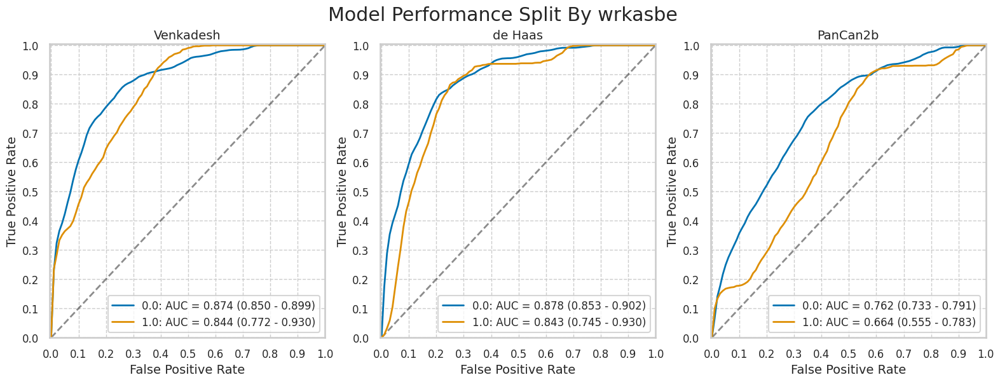

wrkbaki


,num,pct,num_mal,pct_mal
0.0,2018,97.866149,262,12.983152
1.0,44,2.133851,3,6.818182


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2018,248,825,931,14,0.946565,0.469818,0.053435,0.530182,0.231128,0.985185,0.768872,0.014815,0.584242
1.0,44,1,12,29,2,0.333333,0.292683,0.666667,0.707317,0.076923,0.935484,0.923077,0.064516,0.681818


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2018,255,993,763,7,0.973282,0.565490,0.026718,0.434510,0.204327,0.990909,0.795673,0.009091,0.504460
1.0,44,3,25,16,0,1.000000,0.609756,0.000000,0.390244,0.107143,1.000000,0.892857,0.000000,0.431818


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2018,237,1042,714,25,0.90458,0.593394,0.09542,0.406606,0.185301,0.966171,0.814699,0.033829,0.471259
1.0,44,3,23,18,0,1.00000,0.560976,0.00000,0.439024,0.115385,1.000000,0.884615,0.000000,0.477273


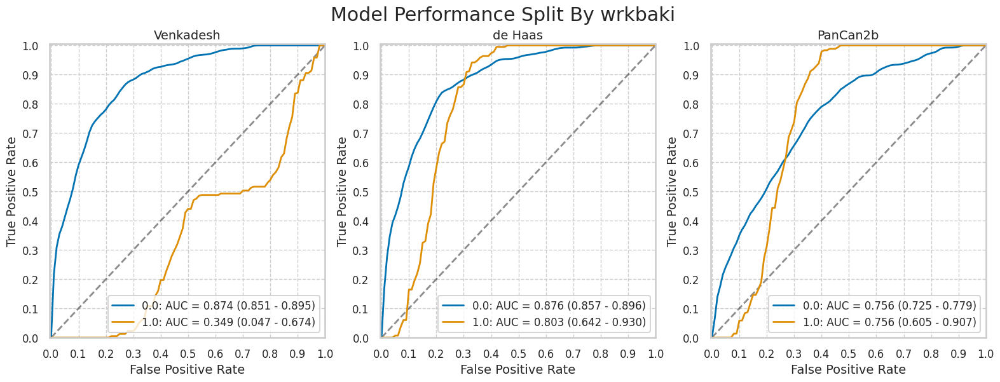

wrkbutc


,num,pct,num_mal,pct_mal
0.0,2029,98.399612,256,12.617053
1.0,33,1.600388,9,27.272727


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2029,240,823,950,16,0.9375,0.464185,0.0625,0.535815,0.225776,0.983437,0.774224,0.016563,0.586496
1.0,33,9,14,10,0,1.0000,0.583333,0.0000,0.416667,0.391304,1.000000,0.608696,0.000000,0.575758


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2029,249,1005,768,7,0.972656,0.566836,0.027344,0.433164,0.198565,0.990968,0.801435,0.009032,0.501232
1.0,33,9,13,11,0,1.000000,0.541667,0.000000,0.458333,0.409091,1.000000,0.590909,0.000000,0.606061


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2029,231,1051,722,25,0.902344,0.592781,0.097656,0.407219,0.180187,0.966533,0.819813,0.033467,0.469690
1.0,33,9,14,10,0,1.000000,0.583333,0.000000,0.416667,0.391304,1.000000,0.608696,0.000000,0.575758


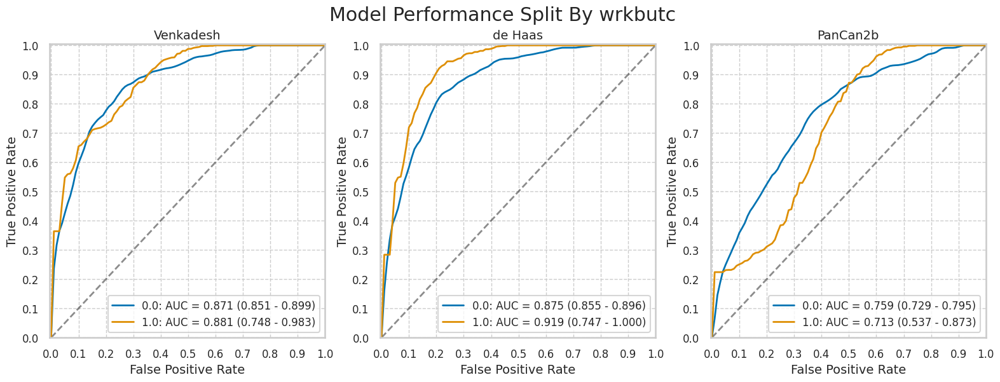

wrkchem


,num,pct,num_mal,pct_mal
0.0,1920,93.24915,252,13.125000
1.0,139,6.75085,13,9.352518


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1920,236,775,893,16,0.936508,0.464628,0.063492,0.535372,0.233432,0.982398,0.766568,0.017602,0.588021
1.0,139,13,61,65,0,1.000000,0.484127,0.000000,0.515873,0.175676,1.000000,0.824324,0.000000,0.561151


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1920,245,950,718,7,0.972222,0.569544,0.027778,0.430456,0.205021,0.990345,0.794979,0.009655,0.501563
1.0,139,13,66,60,0,1.000000,0.523810,0.000000,0.476190,0.164557,1.000000,0.835443,0.000000,0.525180


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1920,228,994,674,24,0.904762,0.595923,0.095238,0.404077,0.186579,0.965616,0.813421,0.034384,0.469792
1.0,139,12,69,57,1,0.923077,0.547619,0.076923,0.452381,0.148148,0.982759,0.851852,0.017241,0.496403


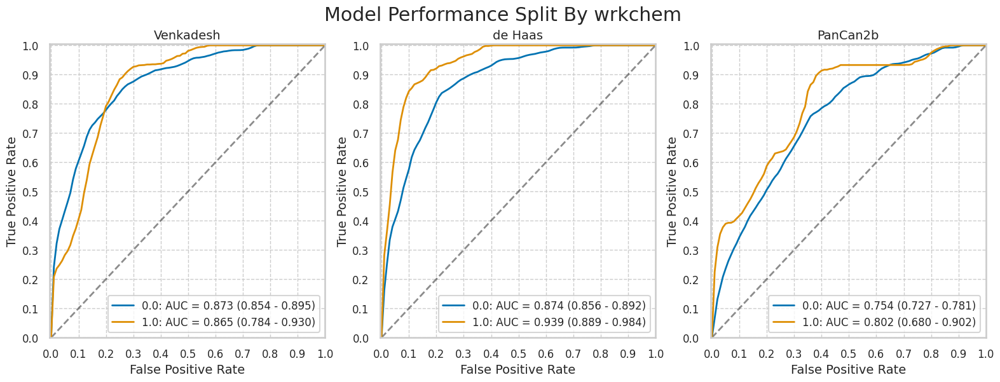

wrkcoal


,num,pct,num_mal,pct_mal
0.0,2048,99.321048,264,12.890625
1.0,14,0.678952,1,7.142857


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2048,248,827,957,16,0.939394,0.463565,0.060606,0.536435,0.230698,0.983556,0.769302,0.016444,0.588379
1.0,14,1,10,3,0,1.000000,0.769231,0.000000,0.230769,0.090909,1.000000,0.909091,0.000000,0.285714


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2048,257,1011,773,7,0.973485,0.566704,0.026515,0.433296,0.202681,0.991026,0.797319,0.008974,0.50293
1.0,14,1,7,6,0,1.000000,0.538462,0.000000,0.461538,0.125000,1.000000,0.875000,0.000000,0.50000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2048,239,1056,728,25,0.905303,0.591928,0.094697,0.408072,0.184556,0.966799,0.815444,0.033201,0.472168
1.0,14,1,9,4,0,1.000000,0.692308,0.000000,0.307692,0.100000,1.000000,0.900000,0.000000,0.357143


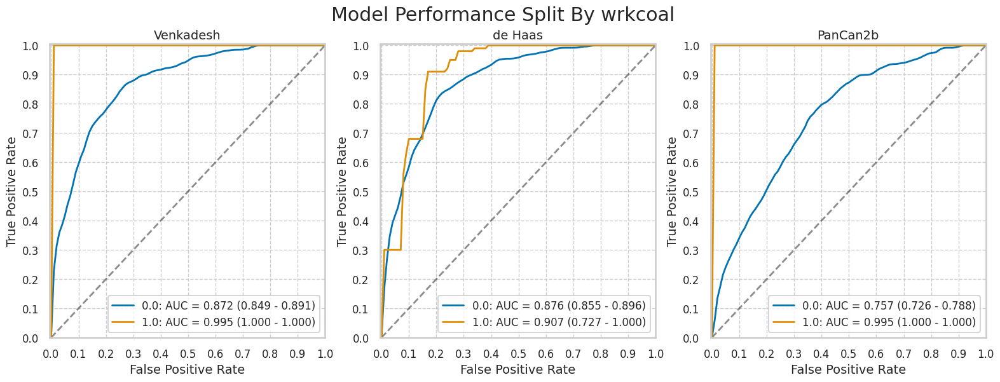

wrkcott


,num,pct,num_mal,pct_mal
0.0,2045,99.175558,259,12.665037
1.0,17,0.824442,6,35.294118


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2045,243,831,955,16,0.938224,0.465286,0.061776,0.534714,0.226257,0.983522,0.773743,0.016478,0.585819
1.0,17,6,6,5,0,1.000000,0.545455,0.000000,0.454545,0.500000,1.000000,0.500000,0.000000,0.647059


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2045,252,1012,774,7,0.972973,0.566629,0.027027,0.433371,0.199367,0.991037,0.800633,0.008963,0.501711
1.0,17,6,6,5,0,1.000000,0.545455,0.000000,0.454545,0.500000,1.000000,0.500000,0.000000,0.647059


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2045,235,1057,729,24,0.907336,0.591825,0.092664,0.408175,0.181889,0.968127,0.818111,0.031873,0.471394
1.0,17,5,8,3,1,0.833333,0.727273,0.166667,0.272727,0.384615,0.750000,0.615385,0.250000,0.470588


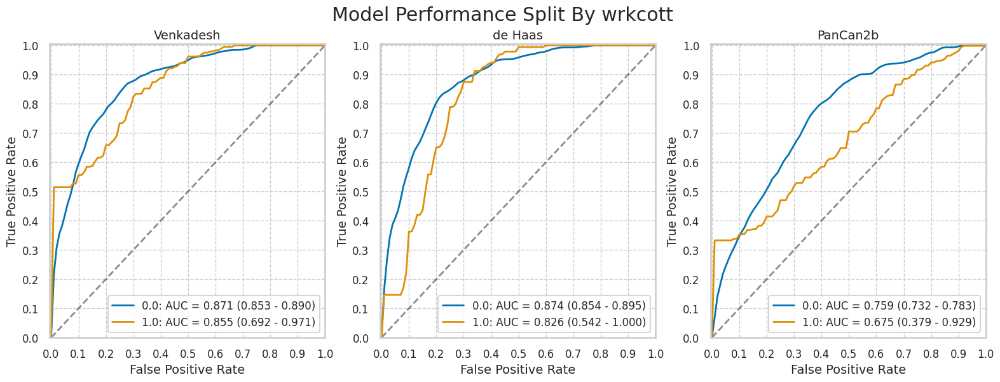

wrkfarm


,num,pct,num_mal,pct_mal
0.0,1805,87.536372,234,12.963989
1.0,257,12.463628,31,12.062257


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1805,221,744,827,13,0.944444,0.473584,0.055556,0.526416,0.229016,0.984524,0.770984,0.015476,0.580609
1.0,257,28,93,133,3,0.903226,0.411504,0.096774,0.588496,0.231405,0.977941,0.768595,0.022059,0.626459


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1805,228,915,656,6,0.974359,0.582432,0.025641,0.417568,0.199475,0.990937,0.800525,0.009063,0.489751
1.0,257,30,103,123,1,0.967742,0.455752,0.032258,0.544248,0.225564,0.991935,0.774436,0.008065,0.595331


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1805,210,940,631,24,0.897436,0.598345,0.102564,0.401655,0.182609,0.963359,0.817391,0.036641,0.465928
1.0,257,30,125,101,1,0.967742,0.553097,0.032258,0.446903,0.193548,0.990196,0.806452,0.009804,0.509728


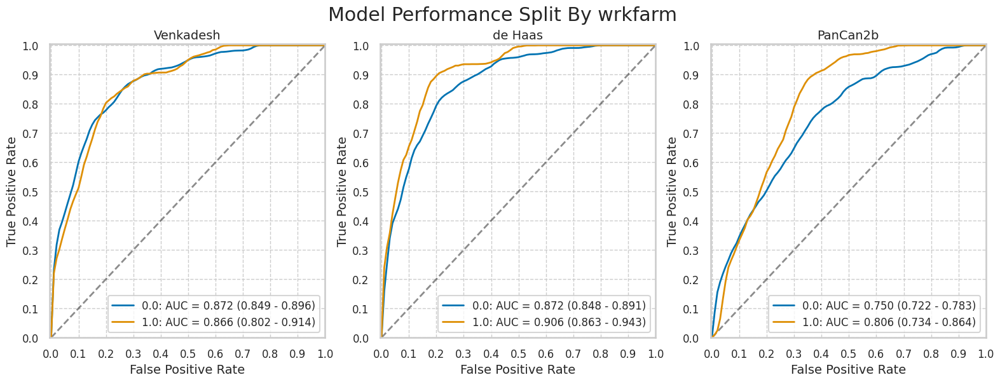

wrkfire


,num,pct,num_mal,pct_mal
0.0,2029,98.399612,259,12.764909
1.0,33,1.600388,6,18.181818


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2029,243,830,940,16,0.938224,0.468927,0.061776,0.531073,0.226468,0.983264,0.773532,0.016736,0.583046
1.0,33,6,7,20,0,1.000000,0.259259,0.000000,0.740741,0.461538,1.000000,0.538462,0.000000,0.787879


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2029,252,1008,762,7,0.972973,0.569492,0.027027,0.430508,0.200,0.990897,0.800,0.009103,0.499754
1.0,33,6,10,17,0,1.000000,0.370370,0.000000,0.629630,0.375,1.000000,0.625,0.000000,0.696970


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2029,234,1053,717,25,0.903475,0.594915,0.096525,0.405085,0.181818,0.966307,0.818182,0.033693,0.468704
1.0,33,6,12,15,0,1.000000,0.444444,0.000000,0.555556,0.333333,1.000000,0.666667,0.000000,0.636364


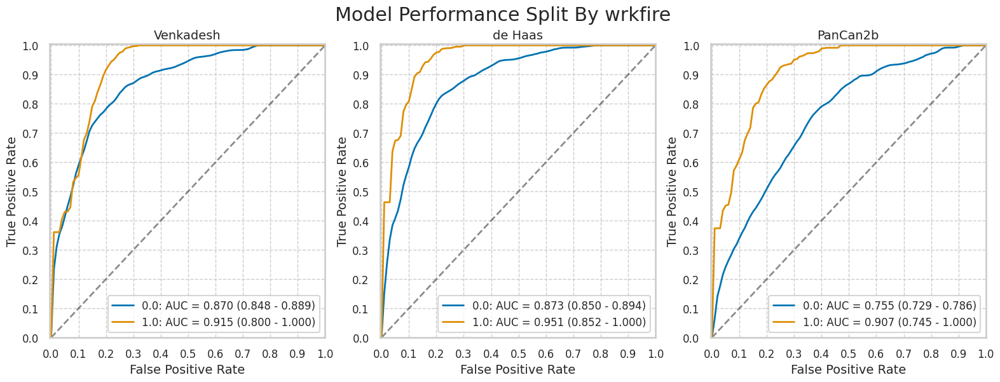

wrkflou


,num,pct,num_mal,pct_mal
0.0,2025,98.205626,262,12.938272
1.0,37,1.794374,3,8.108108


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2025,246,825,938,16,0.938931,0.467952,0.061069,0.532048,0.229692,0.983229,0.770308,0.016771,0.584691
1.0,37,3,12,22,0,1.000000,0.352941,0.000000,0.647059,0.200000,1.000000,0.800000,0.000000,0.675676


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2025,256,1005,758,6,0.977099,0.570051,0.022901,0.429949,0.203013,0.992147,0.796987,0.007853,0.500741
1.0,37,2,13,21,1,0.666667,0.382353,0.333333,0.617647,0.133333,0.954545,0.866667,0.045455,0.621622


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2025,237,1044,719,25,0.90458,0.592172,0.09542,0.407828,0.185012,0.966398,0.814988,0.033602,0.472099
1.0,37,3,21,13,0,1.00000,0.617647,0.00000,0.382353,0.125000,1.000000,0.875000,0.000000,0.432432


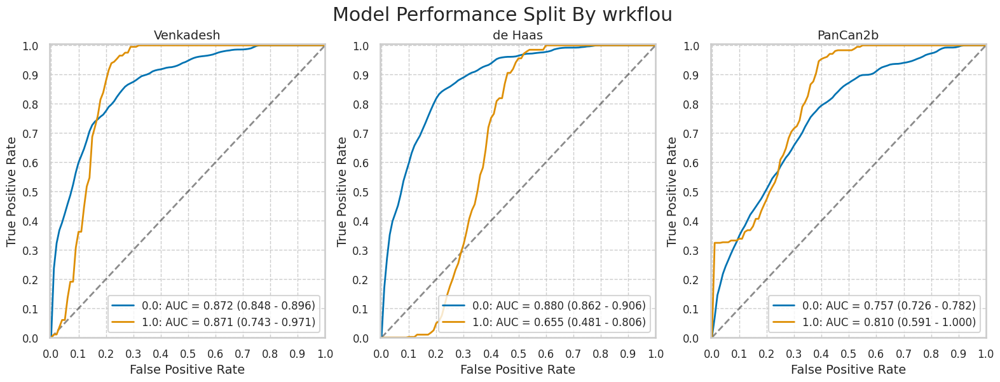

wrkfoun


,num,pct,num_mal,pct_mal
0.0,1974,95.732299,242,12.259372
1.0,88,4.267701,23,26.136364


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1974,231,807,925,11,0.954545,0.465935,0.045455,0.534065,0.222543,0.988248,0.777457,0.011752,0.585613
1.0,88,18,30,35,5,0.782609,0.461538,0.217391,0.538462,0.375000,0.875000,0.625000,0.125000,0.602273


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1974,236,982,750,6,0.975207,0.566975,0.024793,0.433025,0.19376,0.992063,0.80624,0.007937,0.499493
1.0,88,22,36,29,1,0.956522,0.553846,0.043478,0.446154,0.37931,0.966667,0.62069,0.033333,0.579545


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1974,220,1026,706,22,0.909091,0.592379,0.090909,0.407621,0.176565,0.969780,0.823435,0.030220,0.469098
1.0,88,20,39,26,3,0.869565,0.600000,0.130435,0.400000,0.338983,0.896552,0.661017,0.103448,0.522727


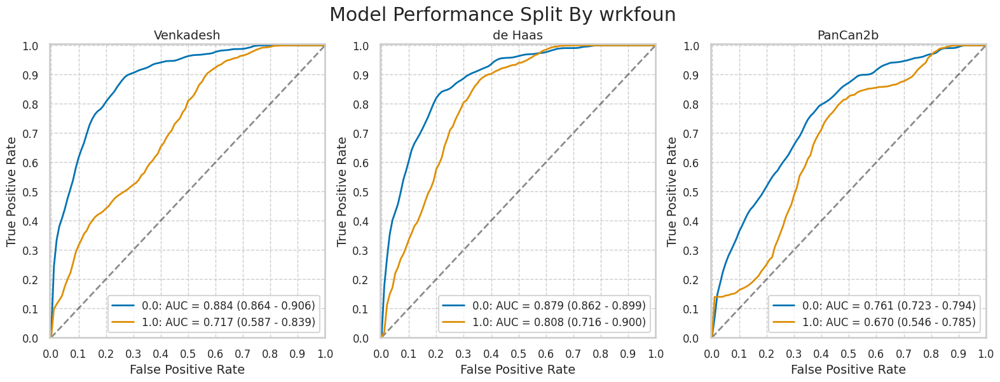

wrkhard


,num,pct,num_mal,pct_mal
0.0,2046,99.224054,265,12.952102
1.0,16,0.775946,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkpain


,num,pct,num_mal,pct_mal
0.0,1936,93.889428,248,12.809917
1.0,126,6.110572,17,13.492063


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1936,234,793,895,14,0.943548,0.469787,0.056452,0.530213,0.227848,0.984598,0.772152,0.015402,0.583161
1.0,126,15,44,65,2,0.882353,0.403670,0.117647,0.596330,0.254237,0.970149,0.745763,0.029851,0.634921


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1936,242,960,728,6,0.975806,0.56872,0.024194,0.43128,0.201331,0.991826,0.798669,0.008174,0.501033
1.0,126,16,58,51,1,0.941176,0.53211,0.058824,0.46789,0.216216,0.980769,0.783784,0.019231,0.531746


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1936,223,1014,674,25,0.899194,0.600711,0.100806,0.399289,0.180275,0.964235,0.819725,0.035765,0.463326
1.0,126,17,51,58,0,1.000000,0.467890,0.000000,0.532110,0.250000,1.000000,0.750000,0.000000,0.595238


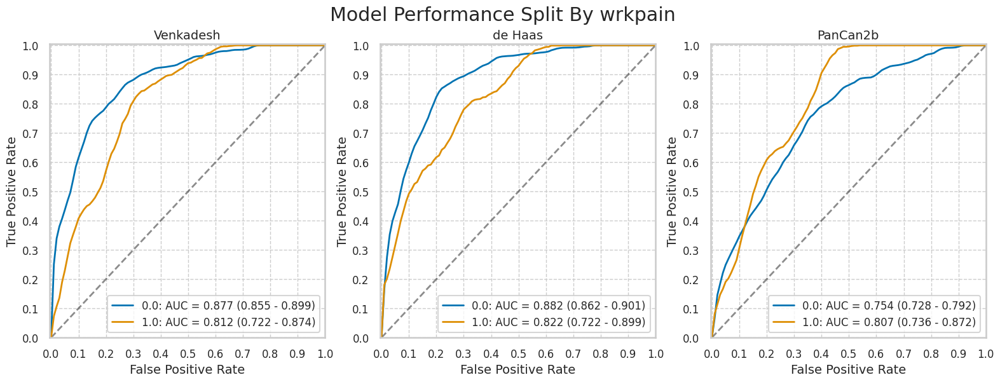

wrksand


,num,pct,num_mal,pct_mal
0.0,2020,97.963143,258,12.772277
1.0,42,2.036857,7,16.666667


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2020,242,815,947,16,0.937984,0.462543,0.062016,0.537457,0.228950,0.983385,0.771050,0.016615,0.588614
1.0,42,7,22,13,0,1.000000,0.628571,0.000000,0.371429,0.241379,1.000000,0.758621,0.000000,0.476190


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2020,252,992,770,6,0.976744,0.562997,0.023256,0.437003,0.202572,0.992268,0.797428,0.007732,0.505941
1.0,42,6,26,9,1,0.857143,0.742857,0.142857,0.257143,0.187500,0.900000,0.812500,0.100000,0.357143


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2020,233,1042,720,25,0.903101,0.591373,0.096899,0.408627,0.182745,0.966443,0.817255,0.033557,0.471782
1.0,42,7,23,12,0,1.000000,0.657143,0.000000,0.342857,0.233333,1.000000,0.766667,0.000000,0.452381


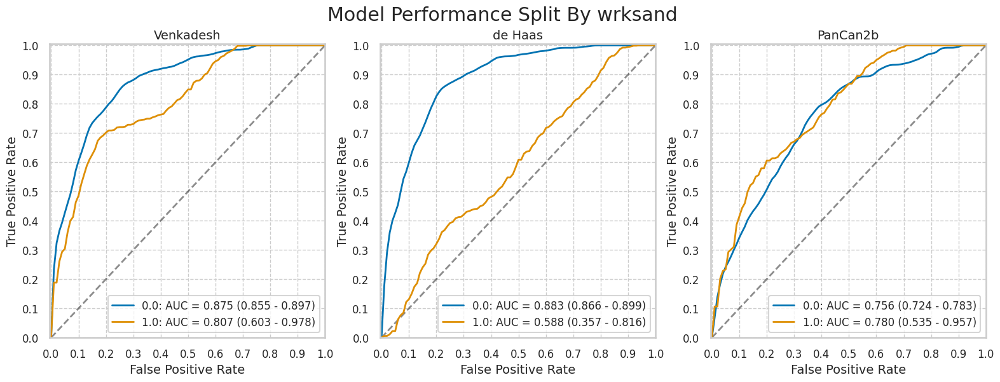

wrkweld


,num,pct,num_mal,pct_mal
0.0,1924,93.307468,240,12.474012
1.0,138,6.692532,25,18.115942


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1924,224,779,905,16,0.933333,0.462589,0.066667,0.537411,0.223330,0.982628,0.776670,0.017372,0.586798
1.0,138,25,58,55,0,1.000000,0.513274,0.000000,0.486726,0.301205,1.000000,0.698795,0.000000,0.579710


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1924,234,958,726,6,0.975,0.568884,0.025,0.431116,0.196309,0.991803,0.803691,0.008197,0.498960
1.0,138,24,60,53,1,0.960,0.530973,0.040,0.469027,0.285714,0.981481,0.714286,0.018519,0.557971


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1924,217,999,685,23,0.904167,0.593230,0.095833,0.406770,0.178454,0.967514,0.821546,0.032486,0.468815
1.0,138,23,66,47,2,0.920000,0.584071,0.080000,0.415929,0.258427,0.959184,0.741573,0.040816,0.507246


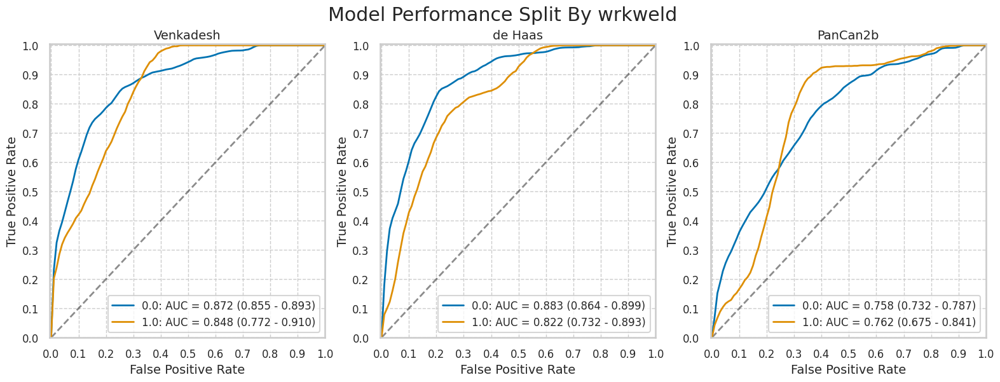

wrknomask


,num,pct,num_mal,pct_mal
False,1532,74.296799,199,12.989556
True,530,25.703201,66,12.452830


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1532,188,635,698,11,0.944724,0.476369,0.055276,0.523631,0.228433,0.984485,0.771567,0.015515,0.578329
True,530,61,202,262,5,0.924242,0.435345,0.075758,0.564655,0.231939,0.981273,0.768061,0.018727,0.609434


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1532,194,779,554,5,0.974874,0.584396,0.025126,0.415604,0.199383,0.991055,0.800617,0.008945,0.488251
True,530,64,239,225,2,0.969697,0.515086,0.030303,0.484914,0.211221,0.991189,0.788779,0.008811,0.545283


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1532,179,807,526,20,0.899497,0.605401,0.100503,0.394599,0.181542,0.963370,0.818458,0.036630,0.460183
True,530,61,258,206,5,0.924242,0.556034,0.075758,0.443966,0.191223,0.976303,0.808777,0.023697,0.503774


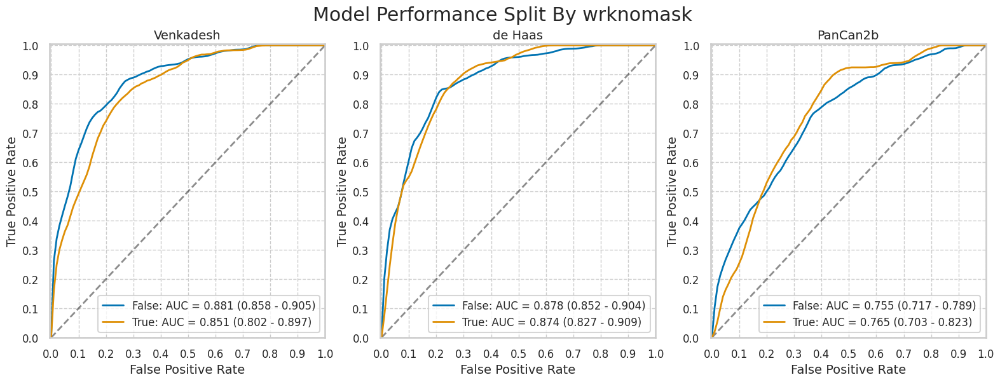

In [16]:
for cat in nlst_democols['cat']['work']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Disease history

,num,pct,num_mal,pct_mal
False,1307,63.385063,145,11.094109
True,755,36.614937,120,15.894040


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1307,137,520,642,8,0.944828,0.447504,0.055172,0.552496,0.208524,0.987692,0.791476,0.012308,0.596021
True,755,112,317,318,8,0.933333,0.499213,0.066667,0.500787,0.261072,0.975460,0.738928,0.024540,0.569536


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1307,142,641,521,3,0.979310,0.551635,0.020690,0.448365,0.181354,0.994275,0.818646,0.005725,0.507269
True,755,116,377,258,4,0.966667,0.593701,0.033333,0.406299,0.235294,0.984733,0.764706,0.015267,0.495364


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1307,131,646,516,14,0.903448,0.555938,0.096552,0.444062,0.168597,0.973585,0.831403,0.026415,0.495027
True,755,109,419,216,11,0.908333,0.659843,0.091667,0.340157,0.206439,0.951542,0.793561,0.048458,0.430464


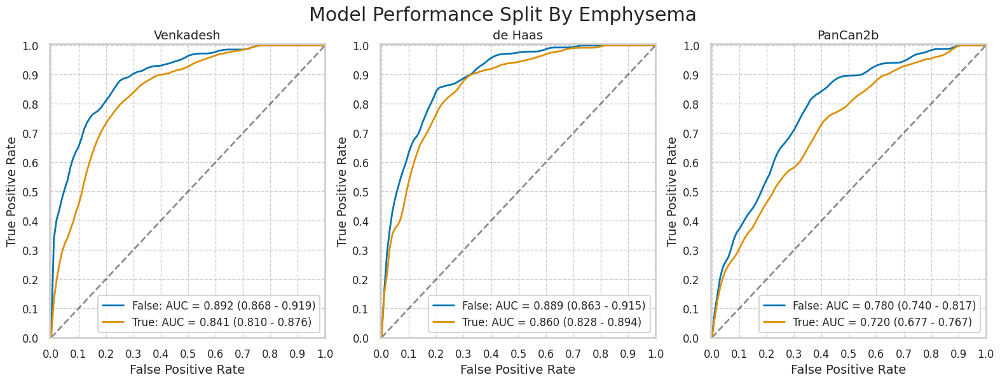

,num,pct,num_mal,pct_mal
False,1307,63.385063,145,11.094109
True,755,36.614937,120,15.894040


In [17]:
plot_by_category(nlst_preds, 'Emphysema')

diagadas


,num,pct,num_mal,pct_mal
0.0,1931,93.82896,249,12.894873
1.0,127,6.17104,13,10.236220


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1931,234,771,911,15,0.939759,0.458383,0.060241,0.541617,0.232836,0.983801,0.767164,0.016199,0.592957
1.0,127,12,66,48,1,0.923077,0.578947,0.076923,0.421053,0.153846,0.979592,0.846154,0.020408,0.472441


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1931,242,939,743,7,0.971888,0.558264,0.028112,0.441736,0.204911,0.990667,0.795089,0.009333,0.510098
1.0,127,13,78,36,0,1.000000,0.684211,0.000000,0.315789,0.142857,1.000000,0.857143,0.000000,0.385827


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1931,226,979,703,23,0.907631,0.582045,0.092369,0.417955,0.187552,0.968320,0.812448,0.031680,0.481098
1.0,127,11,86,28,2,0.846154,0.754386,0.153846,0.245614,0.113402,0.933333,0.886598,0.066667,0.307087


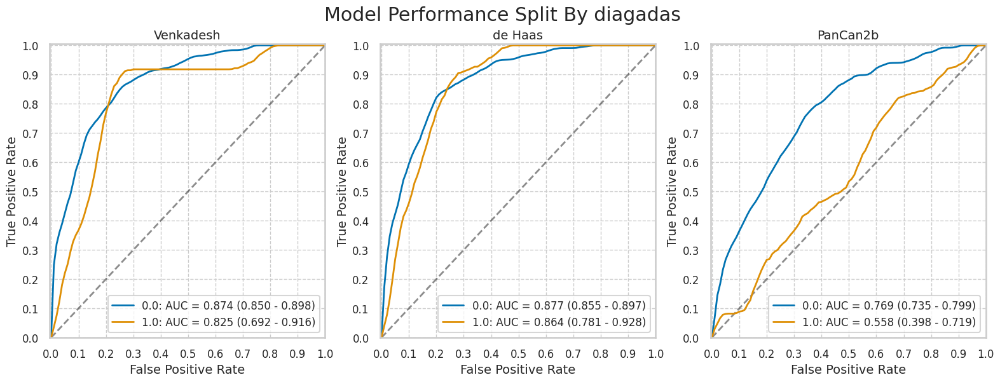

diagasbe


,num,pct,num_mal,pct_mal
0.0,2024,98.252427,265,13.092885
1.0,36,1.747573,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagbron


,num,pct,num_mal,pct_mal
0.0,1971,95.959104,258,13.089802
1.0,83,4.040896,4,4.819277


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1971,242,800,913,16,0.937984,0.467017,0.062016,0.532983,0.232246,0.982777,0.767754,0.017223,0.585997
1.0,83,4,34,45,0,1.000000,0.430380,0.000000,0.569620,0.105263,1.000000,0.894737,0.000000,0.590361


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1971,251,974,739,7,0.972868,0.568593,0.027132,0.431407,0.204898,0.990617,0.795102,0.009383,0.502283
1.0,83,4,42,37,0,1.000000,0.531646,0.000000,0.468354,0.086957,1.000000,0.913043,0.000000,0.493976


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1971,234,1015,698,24,0.906977,0.592528,0.093023,0.407472,0.187350,0.966759,0.812650,0.033241,0.472856
1.0,83,3,48,31,1,0.750000,0.607595,0.250000,0.392405,0.058824,0.968750,0.941176,0.031250,0.409639


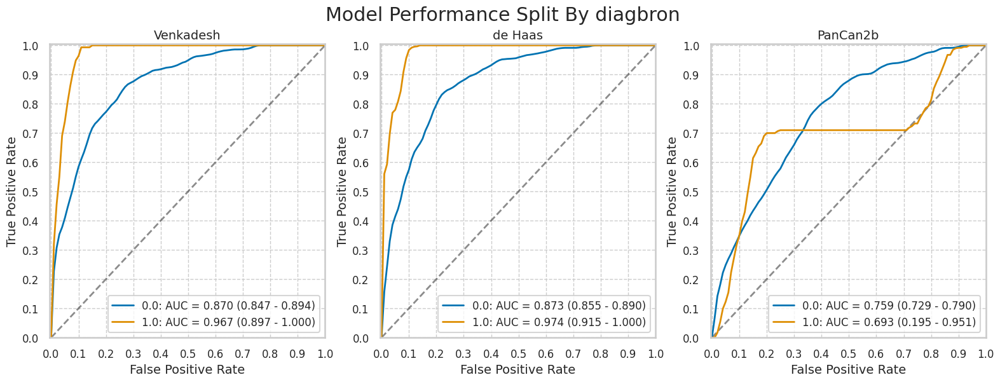

diagchas


,num,pct,num_mal,pct_mal
0.0,1989,96.50655,263,13.222725
1.0,72,3.49345,2,2.777778


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1989,247,800,926,16,0.939163,0.463499,0.060837,0.536501,0.235912,0.983015,0.764088,0.016985,0.589744
1.0,72,2,37,33,0,1.000000,0.528571,0.000000,0.471429,0.051282,1.000000,0.948718,0.000000,0.486111


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1989,256,975,751,7,0.973384,0.56489,0.026616,0.43511,0.207961,0.990765,0.792039,0.009235,0.506285
1.0,72,2,42,28,0,1.000000,0.60000,0.000000,0.40000,0.045455,1.000000,0.954545,0.000000,0.416667


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1989,238,1023,703,25,0.904943,0.5927,0.095057,0.4073,0.188739,0.965659,0.811261,0.034341,0.473102
1.0,72,2,42,28,0,1.000000,0.6000,0.000000,0.4000,0.045455,1.000000,0.954545,0.000000,0.416667


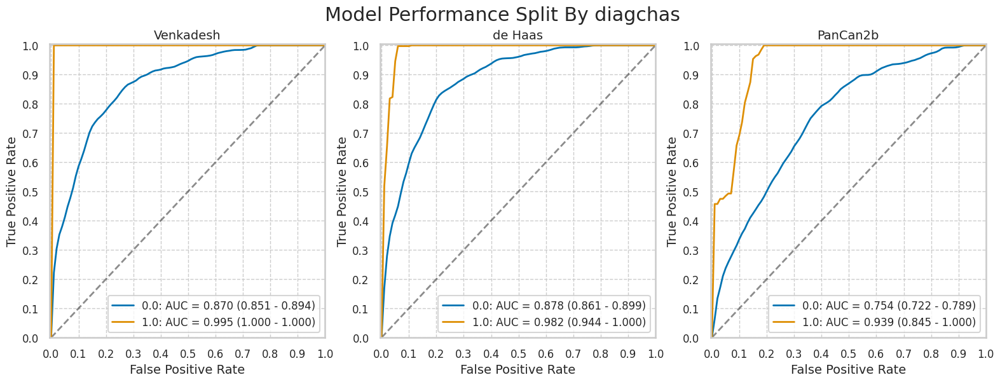

diagchro


,num,pct,num_mal,pct_mal
0.0,1829,89.002433,231,12.629852
1.0,226,10.997567,31,13.716814


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1829,217,737,861,14,0.939394,0.461202,0.060606,0.538798,0.227463,0.984000,0.772537,0.016000,0.589393
1.0,226,29,96,99,2,0.935484,0.492308,0.064516,0.507692,0.232000,0.980198,0.768000,0.019802,0.566372


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1829,224,901,697,7,0.969697,0.563830,0.030303,0.436170,0.199111,0.990057,0.800889,0.009943,0.503554
1.0,226,31,114,81,0,1.000000,0.584615,0.000000,0.415385,0.213793,1.000000,0.786207,0.000000,0.495575


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1829,210,942,656,21,0.909091,0.589487,0.090909,0.410513,0.182292,0.968981,0.817708,0.031019,0.473483
1.0,226,27,122,73,4,0.870968,0.625641,0.129032,0.374359,0.181208,0.948052,0.818792,0.051948,0.442478


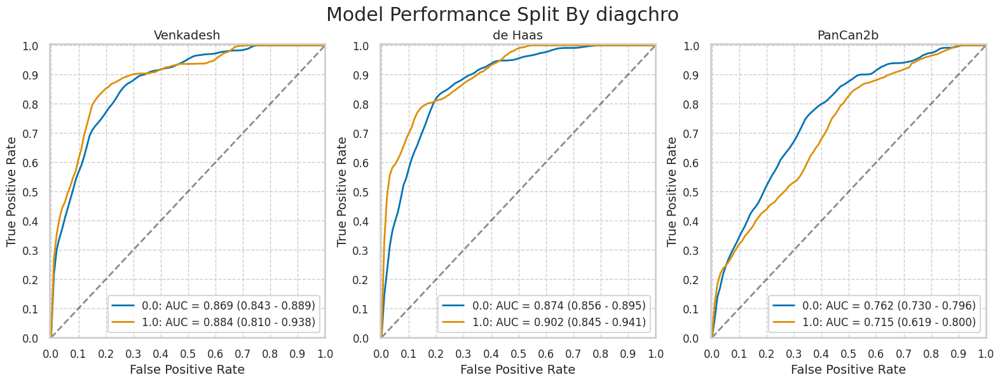

diagcopd


,num,pct,num_mal,pct_mal
0.0,1916,93.054881,246,12.839248
1.0,143,6.945119,19,13.286713


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1916,230,772,898,16,0.934959,0.462275,0.065041,0.537725,0.229541,0.982495,0.770459,0.017505,0.588727
1.0,143,19,64,60,0,1.000000,0.516129,0.000000,0.483871,0.228916,1.000000,0.771084,0.000000,0.552448


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1916,239,945,725,7,0.971545,0.565868,0.028455,0.434132,0.201858,0.990437,0.798142,0.009563,0.503132
1.0,143,19,72,52,0,1.000000,0.580645,0.000000,0.419355,0.208791,1.000000,0.791209,0.000000,0.496503


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1916,221,976,694,25,0.898374,0.584431,0.101626,0.415569,0.184628,0.965229,0.815372,0.034771,0.477557
1.0,143,19,88,36,0,1.000000,0.709677,0.000000,0.290323,0.177570,1.000000,0.822430,0.000000,0.384615


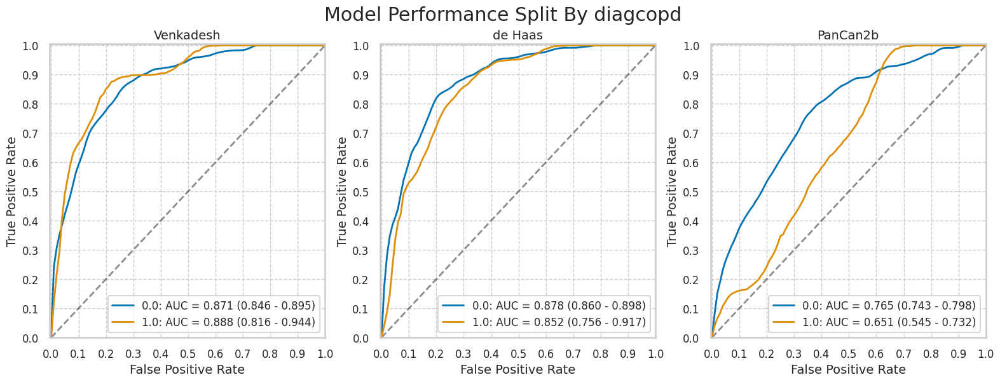

diagdiab


,num,pct,num_mal,pct_mal
0.0,1846,89.524733,243,13.163597
1.0,216,10.475267,22,10.185185


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1846,231,760,843,12,0.950617,0.474111,0.049383,0.525889,0.233098,0.985965,0.766902,0.014035,0.581798
1.0,216,18,77,117,4,0.818182,0.396907,0.181818,0.603093,0.189474,0.966942,0.810526,0.033058,0.625000


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1846,237,912,691,6,0.975309,0.568933,0.024691,0.431067,0.206266,0.991392,0.793734,0.008608,0.502709
1.0,216,21,106,88,1,0.954545,0.546392,0.045455,0.453608,0.165354,0.988764,0.834646,0.011236,0.504630


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1846,220,952,651,23,0.905350,0.593886,0.094650,0.406114,0.187713,0.965875,0.812287,0.034125,0.471831
1.0,216,20,113,81,2,0.909091,0.582474,0.090909,0.417526,0.150376,0.975904,0.849624,0.024096,0.467593


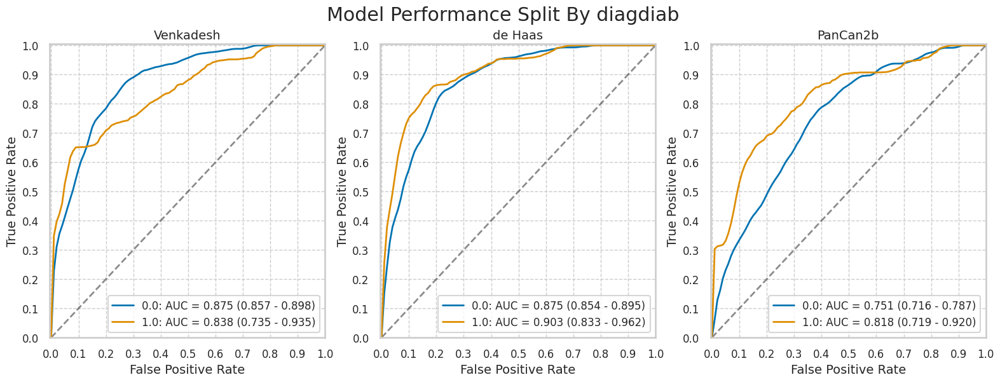

diagemph


,num,pct,num_mal,pct_mal
0.0,1853,90.038873,238,12.844037
1.0,205,9.961127,27,13.170732


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1853,223,735,880,15,0.936975,0.455108,0.063025,0.544892,0.232777,0.983240,0.767223,0.016760,0.595251
1.0,205,26,101,77,1,0.962963,0.567416,0.037037,0.432584,0.204724,0.987179,0.795276,0.012821,0.502439


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1853,231,913,702,7,0.970588,0.565325,0.029412,0.434675,0.201923,0.990127,0.798077,0.009873,0.503508
1.0,205,27,105,73,0,1.000000,0.589888,0.000000,0.410112,0.204545,1.000000,0.795455,0.000000,0.487805


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1853,214,942,673,24,0.899160,0.583282,0.100840,0.416718,0.185121,0.965567,0.814879,0.034433,0.478683
1.0,205,26,120,58,1,0.962963,0.674157,0.037037,0.325843,0.178082,0.983051,0.821918,0.016949,0.409756


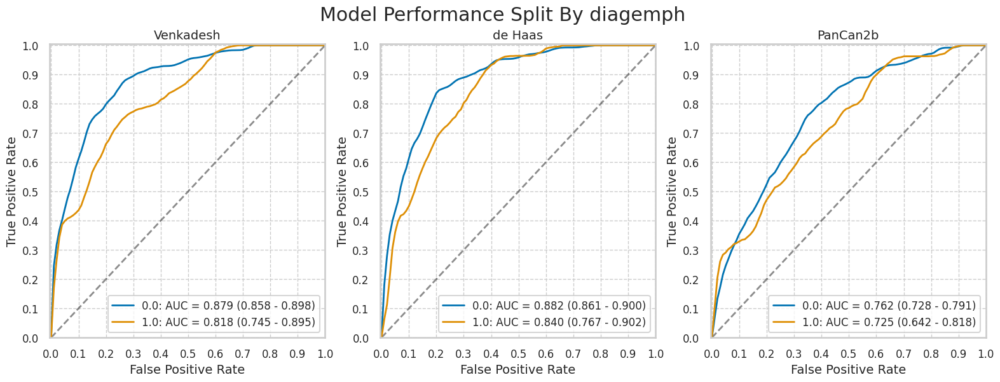

diagfibr


,num,pct,num_mal,pct_mal
0.0,2054,99.612027,265,12.901655
1.0,8,0.387973,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diaghear


,num,pct,num_mal,pct_mal
0.0,1803,87.737226,237,13.144759
1.0,252,12.262774,28,11.111111


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1803,222,719,847,15,0.936709,0.459132,0.063291,0.540868,0.235919,0.982599,0.764081,0.017401,0.592901
1.0,252,27,118,106,1,0.964286,0.526786,0.035714,0.473214,0.186207,0.990654,0.813793,0.009346,0.527778


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1803,230,891,675,7,0.970464,0.568966,0.029536,0.431034,0.205174,0.989736,0.794826,0.010264,0.501941
1.0,252,28,127,97,0,1.000000,0.566964,0.000000,0.433036,0.180645,1.000000,0.819355,0.000000,0.496032


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1803,214,927,639,23,0.902954,0.591954,0.097046,0.408046,0.187555,0.965257,0.812445,0.034743,0.473100
1.0,252,26,133,91,2,0.928571,0.593750,0.071429,0.406250,0.163522,0.978495,0.836478,0.021505,0.464286


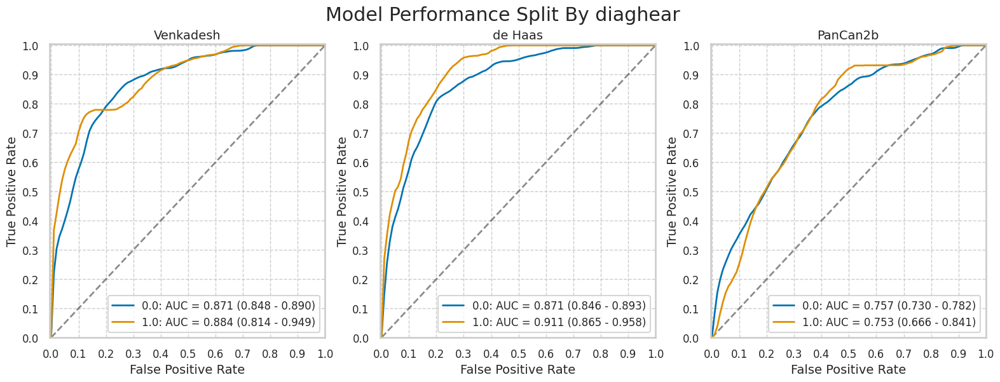

diaghype


,num,pct,num_mal,pct_mal
0.0,1377,66.909621,173,12.563544
1.0,681,33.090379,89,13.069016


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1377,164,560,644,9,0.947977,0.465116,0.052023,0.534884,0.226519,0.986217,0.773481,0.013783,0.586783
1.0,681,82,277,315,7,0.921348,0.467905,0.078652,0.532095,0.228412,0.978261,0.771588,0.021739,0.582966


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1377,168,688,516,5,0.971098,0.571429,0.028902,0.428571,0.196262,0.990403,0.803738,0.009597,0.496732
1.0,681,87,330,262,2,0.977528,0.557432,0.022472,0.442568,0.208633,0.992424,0.791367,0.007576,0.512482


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1377,158,715,489,15,0.913295,0.593854,0.086705,0.406146,0.180985,0.970238,0.819015,0.029762,0.469862
1.0,681,79,349,243,10,0.887640,0.589527,0.112360,0.410473,0.184579,0.960474,0.815421,0.039526,0.472834


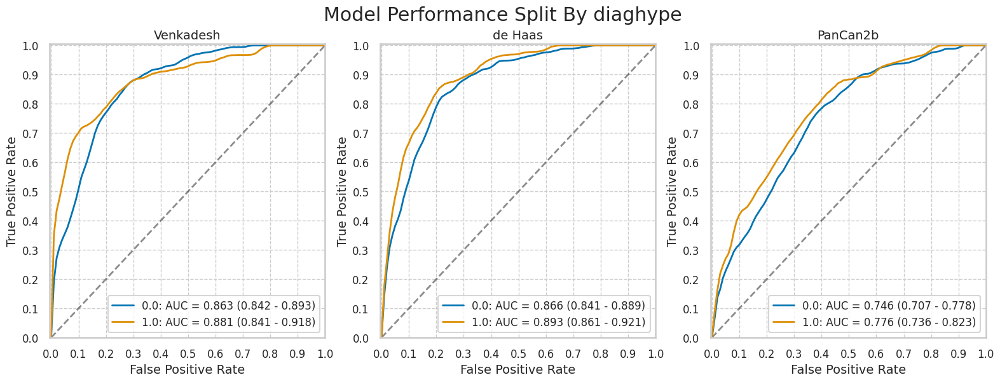

diagpneu


,num,pct,num_mal,pct_mal
0.0,1592,77.356657,209,13.128141
1.0,466,22.643343,56,12.017167


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1592,195,634,749,14,0.933014,0.458424,0.066986,0.541576,0.235223,0.981651,0.764777,0.018349,0.592965
1.0,466,54,203,207,2,0.964286,0.495122,0.035714,0.504878,0.210117,0.990431,0.789883,0.009569,0.560086


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1592,204,778,605,5,0.976077,0.562545,0.023923,0.437455,0.207739,0.991803,0.792261,0.008197,0.508166
1.0,466,54,239,171,2,0.964286,0.582927,0.035714,0.417073,0.184300,0.988439,0.815700,0.011561,0.482833


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1592,188,789,594,21,0.899522,0.570499,0.100478,0.429501,0.192426,0.965854,0.807574,0.034146,0.491206
1.0,466,52,274,136,4,0.928571,0.668293,0.071429,0.331707,0.159509,0.971429,0.840491,0.028571,0.403433


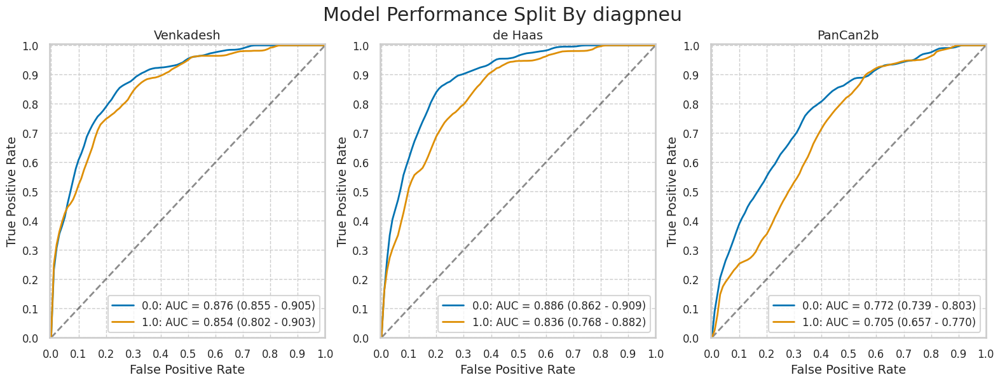

diagsarc


,num,pct,num_mal,pct_mal
0.0,2060,99.903007,264,12.815534
1.0,2,0.096993,1,50.000000


KeyboardInterrupt: 

In [18]:
for cat in nlst_democols['cat']['disease']:
    print(cat)
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

height


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1797.0,67.869226,3.827886,59.0,65.0,68.0,71.0,78.0
1,264.0,68.462121,3.602714,60.0,66.0,69.0,71.0,76.0


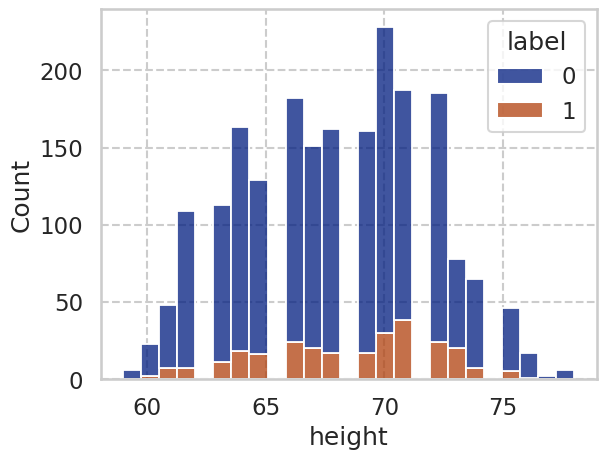

weight


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1795.0,182.337604,39.429356,90.0,155.0,178.0,205.0,322.0
1,265.0,176.547170,35.339675,108.0,151.0,175.0,196.0,322.0


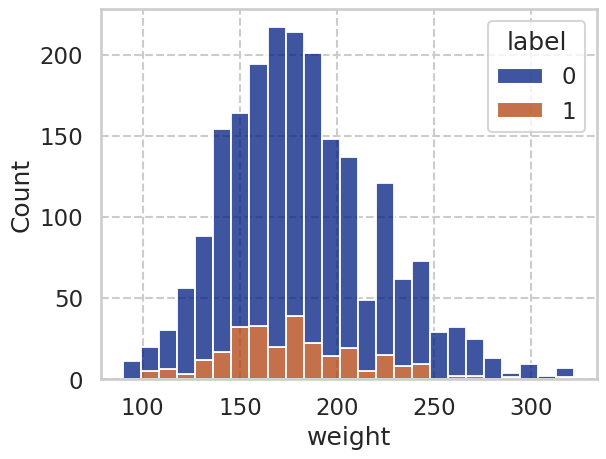

Age


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1797.0,63.171953,5.256233,55.0,59.0,63.0,67.0,76.0
1,265.0,64.343396,5.064639,55.0,61.0,64.0,68.0,75.0


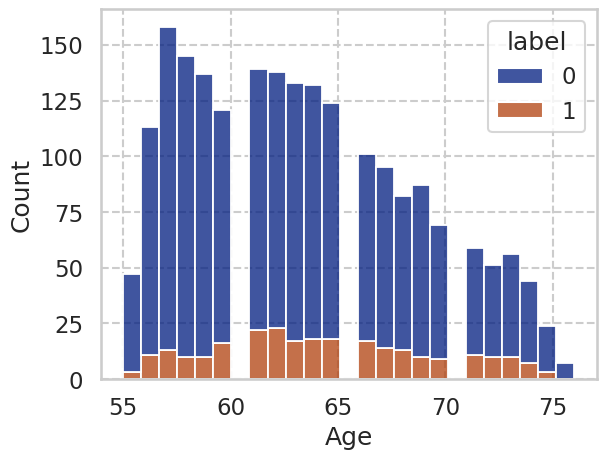

In [19]:
for c in nlst_democols['num']['demo']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"[55, 60)",600.0,0.078333,0.268920,0.0,0.0,0.0,0.0,1.0
"[60, 65)",663.0,0.144796,0.352161,0.0,0.0,0.0,0.0,1.0
"[65, 70)",489.0,0.147239,0.354707,0.0,0.0,0.0,0.0,1.0
"[70, 78)",310.0,0.161290,0.368393,0.0,0.0,0.0,0.0,1.0


,num,pct,num_mal,pct_mal
"[55, 60)",600,29.097963,47,7.833333
"[60, 65)",663,32.153249,96,14.479638
"[65, 70)",489,23.714840,72,14.723926
"[70, 78)",310,15.033948,50,16.129032


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",600,44,226,327,3,0.936170,0.408680,0.063830,0.591320,0.162963,0.990909,0.837037,0.009091,0.618333
"[60, 65)",663,90,255,312,6,0.937500,0.449735,0.062500,0.550265,0.260870,0.981132,0.739130,0.018868,0.606335
"[65, 70)",489,68,213,204,4,0.944444,0.510791,0.055556,0.489209,0.241993,0.980769,0.758007,0.019231,0.556237
"[70, 78)",310,47,143,117,3,0.940000,0.550000,0.060000,0.450000,0.247368,0.975000,0.752632,0.025000,0.529032


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",600,46,329,224,1,0.978723,0.594937,0.021277,0.405063,0.122667,0.995556,0.877333,0.004444,0.450000
"[60, 65)",663,91,295,272,5,0.947917,0.520282,0.052083,0.479718,0.235751,0.981949,0.764249,0.018051,0.547511
"[65, 70)",489,71,232,185,1,0.986111,0.556355,0.013889,0.443645,0.234323,0.994624,0.765677,0.005376,0.523517
"[70, 78)",310,50,162,98,0,1.000000,0.623077,0.000000,0.376923,0.235849,1.000000,0.764151,0.000000,0.477419


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",600,41,280,273,6,0.872340,0.506329,0.127660,0.493671,0.127726,0.978495,0.872274,0.021505,0.523333
"[60, 65)",663,88,330,237,8,0.916667,0.582011,0.083333,0.417989,0.210526,0.967347,0.789474,0.032653,0.490196
"[65, 70)",489,66,257,160,6,0.916667,0.616307,0.083333,0.383693,0.204334,0.963855,0.795666,0.036145,0.462168
"[70, 78)",310,45,198,62,5,0.900000,0.761538,0.100000,0.238462,0.185185,0.925373,0.814815,0.074627,0.345161


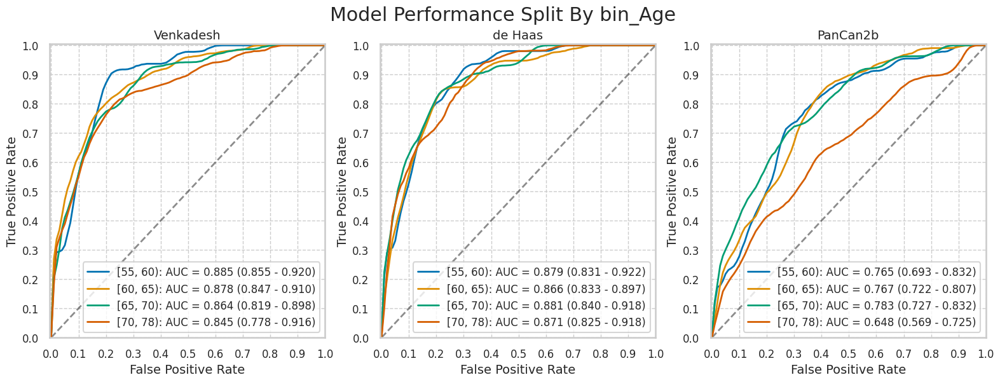

,num,pct,num_mal,pct_mal
"[55, 60)",600,29.097963,47,7.833333
"[60, 65)",663,32.153249,96,14.479638
"[65, 70)",489,23.714840,72,14.723926
"[70, 78)",310,15.033948,50,16.129032


In [20]:
nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')

label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    1086.0  0.112339  0.315928  0.0  0.0  0.0  0.0  1.0  1086.0   
(68, 88]     975.0  0.145641  0.352927  0.0  0.0  0.0  0.0  1.0   975.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.918048  2.229196  59.0  63.0  65.0  67.0  68.0  
(68, 88]    71.316923  1.863700  69.0  70.0  71.0  72.0  78.0

,num,pct,num_mal,pct_mal
"(48, 68]",1086,52.692868,122,11.233886
"(68, 88]",975,47.307132,142,14.564103


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",1086,114,459,505,8,0.934426,0.476141,0.065574,0.523859,0.198953,0.984405,0.801047,0.015595,0.569982
"(68, 88]",975,134,378,455,8,0.943662,0.453782,0.056338,0.546218,0.261719,0.982721,0.738281,0.017279,0.604103


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",1086,118,561,403,4,0.967213,0.581950,0.032787,0.418050,0.173785,0.990172,0.826215,0.009828,0.479742
"(68, 88]",975,139,457,376,3,0.978873,0.548619,0.021127,0.451381,0.233221,0.992084,0.766779,0.007916,0.528205


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",1086,109,623,341,13,0.893443,0.646266,0.106557,0.353734,0.148907,0.963277,0.851093,0.036723,0.414365
"(68, 88]",975,130,442,391,12,0.915493,0.530612,0.084507,0.469388,0.227273,0.970223,0.772727,0.029777,0.534359


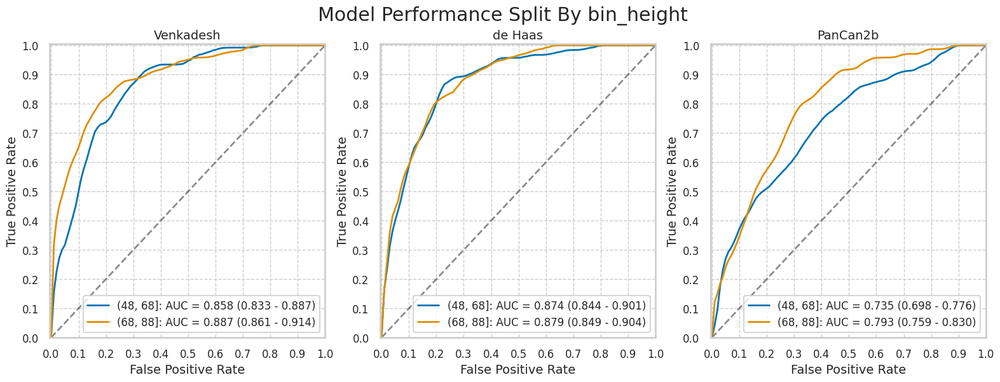

,num,pct,num_mal,pct_mal
"(48, 68]",1086,52.692868,122,11.233886
"(68, 88]",975,47.307132,142,14.564103


In [21]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')

label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   1058.0  0.136106  0.343063  0.0  0.0  0.0  0.0  1.0  1058.0   
(179, 279]   967.0  0.123061  0.328677  0.0  0.0  0.0  0.0  1.0   967.0   

                                                                       
                  mean        std    min    25%    50%     75%    max  
bin_weight                                                             
(79, 179]   151.712665  18.629552   90.0  140.0  155.0  165.75  179.0  
(179, 279]  210.153051  24.129167  180.0  190.0  205.0  225.00  275.0

,num,pct,num_mal,pct_mal
"(79, 179]",1058,52.246914,144,13.610586
"(179, 279]",967,47.753086,119,12.306101


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",1058,139,461,453,5,0.965278,0.504376,0.034722,0.495624,0.231667,0.989083,0.768333,0.010917,0.559546
"(179, 279]",967,109,364,484,10,0.915966,0.429245,0.084034,0.570755,0.230444,0.979757,0.769556,0.020243,0.613237


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",1058,143,549,365,1,0.993056,0.600656,0.006944,0.399344,0.206647,0.997268,0.793353,0.002732,0.480151
"(179, 279]",967,113,452,396,6,0.949580,0.533019,0.050420,0.466981,0.200000,0.985075,0.800000,0.014925,0.526370


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",1058,129,597,317,15,0.895833,0.653173,0.104167,0.346827,0.177686,0.954819,0.822314,0.045181,0.42155
"(179, 279]",967,109,448,400,10,0.915966,0.528302,0.084034,0.471698,0.195691,0.975610,0.804309,0.024390,0.52637


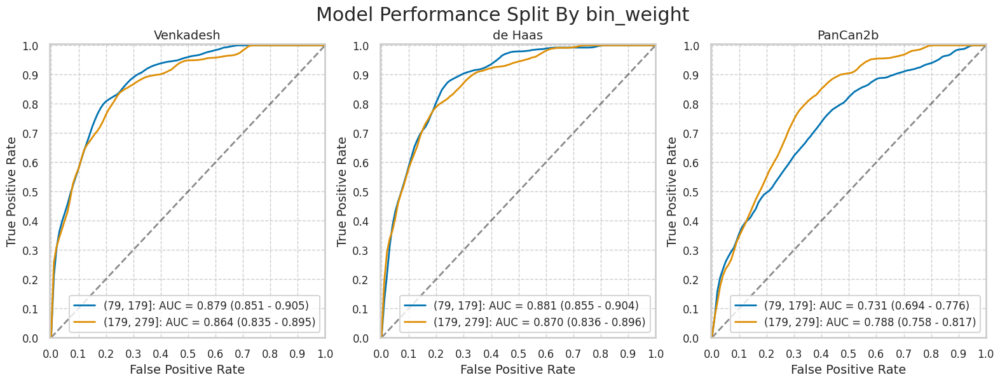

,num,pct,num_mal,pct_mal
"(79, 179]",1058,52.246914,144,13.610586
"(179, 279]",967,47.753086,119,12.306101


In [22]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

pkyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1797.0,56.606093,22.517819,30.0,40.0,50.00,67.5,177.0
1,265.0,67.640377,25.891798,30.0,49.0,61.25,84.0,224.0


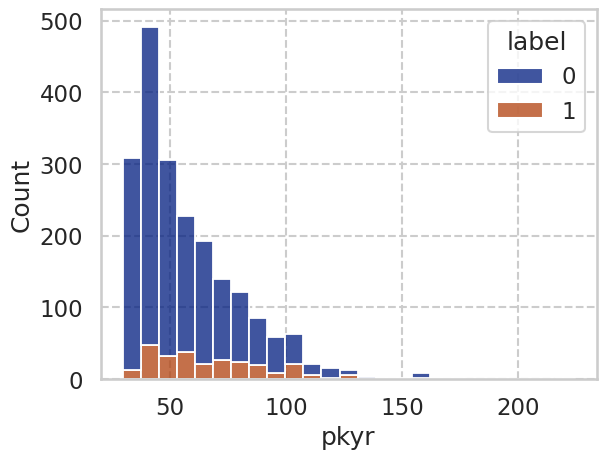

smokeage


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1797.0,16.632721,3.523987,5.0,14.0,16.0,18.0,40.0
1,265.0,16.366038,3.339102,8.0,14.0,16.0,18.0,27.0


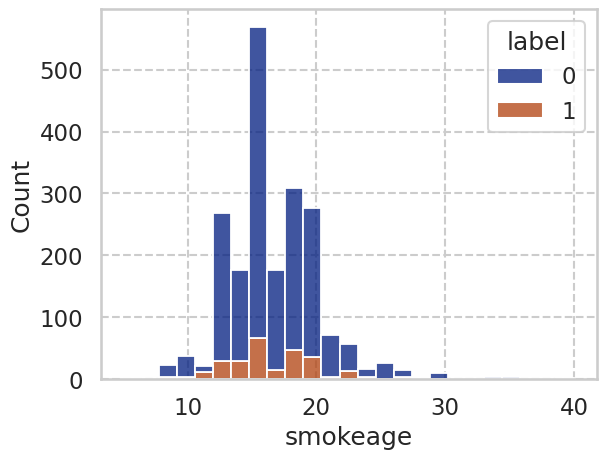

smokeday


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1797.0,28.367279,11.459710,12.0,20.0,25.0,30.0,100.0
1,265.0,30.883019,11.184976,15.0,20.0,30.0,40.0,80.0


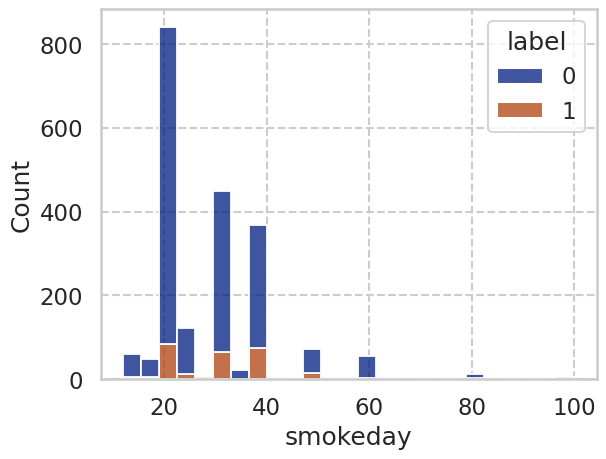

smokeyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1797.0,40.626600,7.418317,17.0,35.0,41.0,45.0,61.0
1,265.0,44.222642,7.247744,26.0,40.0,44.0,49.0,65.0


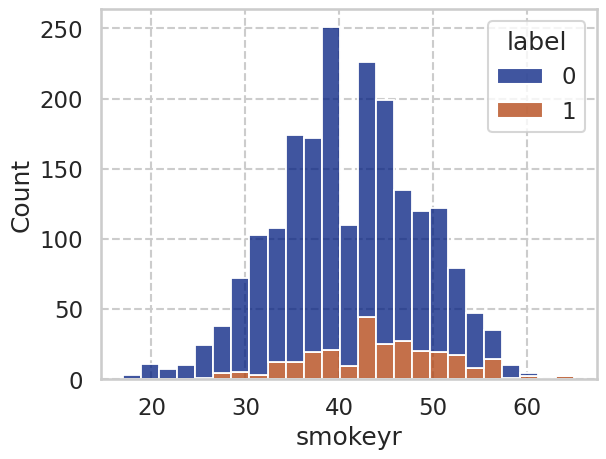

In [23]:
for c in nlst_democols['num']['smoke']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  1034.0  0.079304  0.270343  0.0  0.0  0.0  0.0  1.0  1034.0   
(51.0, 224.0]   1028.0  0.178016  0.382712  0.0  0.0  0.0  0.0  1.0  1028.0   

                                                                         
                     mean        std    min      25%   50%   75%    max  
bin_pkyr                                                                 
(29.999, 51.0]  40.772534   5.745991  30.00  36.8125  41.0  45.0   51.0  
(51.0, 224.0]   75.376508  21.264494  51.25  59.0000  70.0  86.0  224.0

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",1034,50.14549,82,7.930368
"(51.0, 224.0]",1028,49.85451,183,17.801556


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",1034,75,419,533,7,0.914634,0.440126,0.085366,0.559874,0.151822,0.987037,0.848178,0.012963,0.588008
"(51.0, 224.0]",1028,174,418,427,9,0.950820,0.494675,0.049180,0.505325,0.293919,0.979358,0.706081,0.020642,0.584630


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",1034,79,554,398,3,0.963415,0.581933,0.036585,0.418067,0.124803,0.992519,0.875197,0.007481,0.461315
"(51.0, 224.0]",1028,179,464,381,4,0.978142,0.549112,0.021858,0.450888,0.278383,0.989610,0.721617,0.010390,0.544747


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",1034,76,565,387,6,0.926829,0.593487,0.073171,0.406513,0.118565,0.984733,0.881435,0.015267,0.447776
"(51.0, 224.0]",1028,164,500,345,19,0.896175,0.591716,0.103825,0.408284,0.246988,0.947802,0.753012,0.052198,0.495136


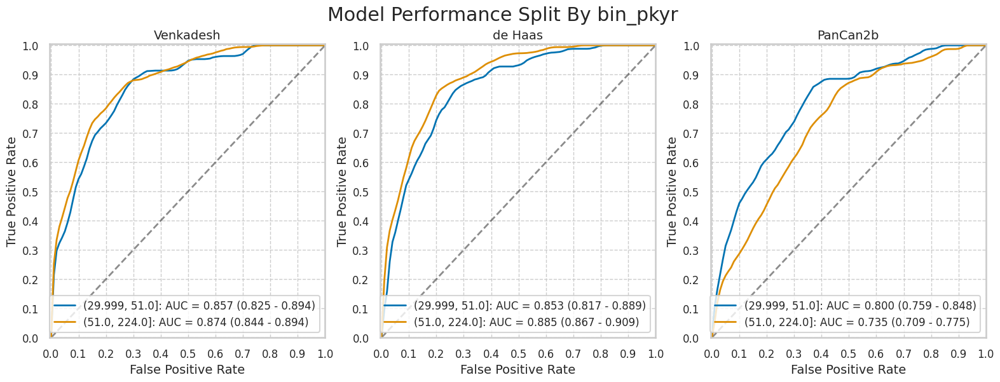

label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  1097.0  0.131267  0.337846  0.0  0.0  0.0  0.0  1.0   1097.0   
(16.0, 40.0]    965.0  0.125389  0.331331  0.0  0.0  0.0  0.0  1.0    965.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.124886  1.830373   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.410363  2.742303  17.0  18.0  18.0  20.0  40.0

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1097,53.200776,144,13.126709
"(16.0, 40.0]",965,46.799224,121,12.538860


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1097,137,459,494,7,0.951389,0.481637,0.048611,0.518363,0.229866,0.986028,0.770134,0.013972,0.575205
"(16.0, 40.0]",965,112,378,466,9,0.925620,0.447867,0.074380,0.552133,0.228571,0.981053,0.771429,0.018947,0.598964


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1097,139,530,423,5,0.965278,0.556139,0.034722,0.443861,0.207773,0.988318,0.792227,0.011682,0.512306
"(16.0, 40.0]",965,119,488,356,2,0.983471,0.578199,0.016529,0.421801,0.196046,0.994413,0.803954,0.005587,0.492228


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1097,127,565,388,17,0.881944,0.592865,0.118056,0.407135,0.183526,0.958025,0.816474,0.041975,0.469462
"(16.0, 40.0]",965,113,500,344,8,0.933884,0.592417,0.066116,0.407583,0.184339,0.977273,0.815661,0.022727,0.473575


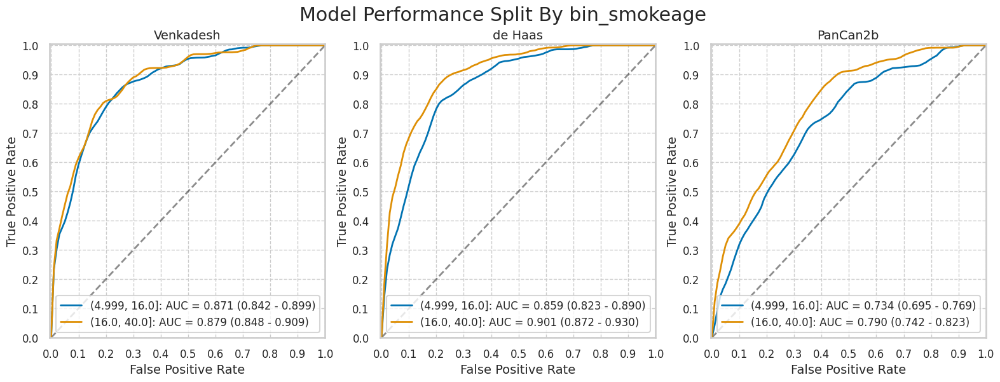

label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  1069.0  0.098223  0.297755  0.0  0.0  0.0  0.0  1.0   1069.0   
(25.0, 100.0]    993.0  0.161128  0.367834  0.0  0.0  0.0  0.0  1.0    993.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.152479   2.180125  12.0  20.0  20.0  20.0   25.0  
(25.0, 100.0]   37.882175  10.211928  28.0  30.0  40.0  40.0  100.0

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1069,51.842871,105,9.822264
"(25.0, 100.0]",993,48.157129,160,16.112790


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1069,97,443,521,8,0.92381,0.459544,0.07619,0.540456,0.179630,0.984877,0.820370,0.015123,0.578110
"(25.0, 100.0]",993,152,394,439,8,0.95000,0.472989,0.05000,0.527011,0.278388,0.982103,0.721612,0.017897,0.595166


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1069,102,565,399,3,0.971429,0.586100,0.028571,0.413900,0.152924,0.992537,0.847076,0.007463,0.468662
"(25.0, 100.0]",993,156,453,380,4,0.975000,0.543818,0.025000,0.456182,0.256158,0.989583,0.743842,0.010417,0.539778


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1069,98,587,377,7,0.933333,0.608921,0.066667,0.391079,0.143066,0.981771,0.856934,0.018229,0.444341
"(25.0, 100.0]",993,142,478,355,18,0.887500,0.573830,0.112500,0.426170,0.229032,0.951743,0.770968,0.048257,0.500504


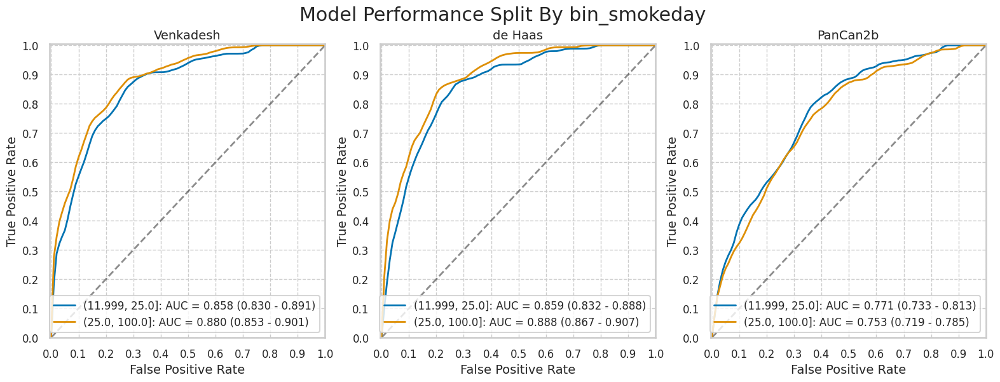

label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(16.999, 41.0]  1083.0  0.079409  0.270501  0.0  0.0  0.0  0.0  1.0  1083.0   
(41.0, 65.0]     979.0  0.182840  0.386733  0.0  0.0  0.0  0.0  1.0   979.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.443213  4.752979  17.0  33.0  36.0  40.0  41.0  
(41.0, 65.0]    47.334014  4.354648  42.0  44.0  46.0  50.0  65.0

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",1083,52.521823,86,7.940905
"(41.0, 65.0]",979,47.478177,179,18.283963


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",1083,82,436,561,4,0.953488,0.437312,0.046512,0.562688,0.158301,0.992920,0.841699,0.007080,0.593721
"(41.0, 65.0]",979,167,401,399,12,0.932961,0.501250,0.067039,0.498750,0.294014,0.970803,0.705986,0.029197,0.578141


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",1083,83,548,449,3,0.965116,0.549649,0.034884,0.450351,0.131537,0.993363,0.868463,0.006637,0.491228
"(41.0, 65.0]",979,175,470,330,4,0.977654,0.587500,0.022346,0.412500,0.271318,0.988024,0.728682,0.011976,0.515832


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",1083,78,550,447,8,0.906977,0.551655,0.093023,0.448345,0.124204,0.982418,0.875796,0.017582,0.484765
"(41.0, 65.0]",979,162,515,285,17,0.905028,0.643750,0.094972,0.356250,0.239291,0.943709,0.760709,0.056291,0.456588


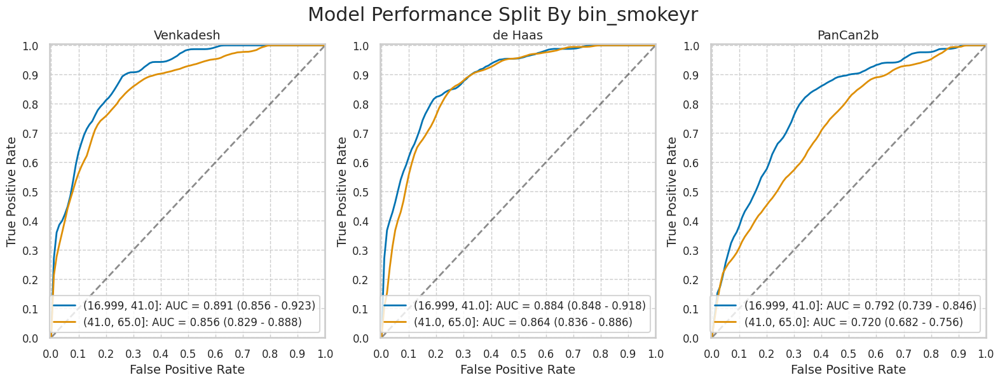

In [24]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

In [25]:
# included_num_cols = ["Diameter [mm]", "NoduleCounts"]
# for c in included_num_cols:
#     print(c)
#     display(nlst_preds.groupby('label')[c].describe())
#     sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
#     plt.show()

In [26]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')

## Further binning categorical columns

In [27]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       1909
2.0   2.0         61
3.0   2.0         23
1.0   1.0         16
6.0   2.0         16
4.0   2.0         15
5.0   2.0          8
2.0   1.0          1
Name: count, dtype: int64

,num,pct,num_mal,pct_mal
False,153,7.419981,29,18.954248
True,1909,92.580019,236,12.362493


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,153,26,78,46,3,0.896552,0.629032,0.103448,0.370968,0.250000,0.938776,0.750000,0.061224,0.470588
True,1909,223,759,914,13,0.944915,0.453676,0.055085,0.546324,0.227088,0.985976,0.772912,0.014024,0.595600


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,153,29,84,40,0,1.000000,0.677419,0.000000,0.322581,0.256637,1.000000,0.743363,0.000000,0.450980
True,1909,229,934,739,7,0.970339,0.558279,0.029661,0.441721,0.196905,0.990617,0.803095,0.009383,0.507072


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,153,25,88,36,4,0.862069,0.709677,0.137931,0.290323,0.221239,0.900000,0.778761,0.100000,0.398693
True,1909,215,977,696,21,0.911017,0.583981,0.088983,0.416019,0.180369,0.970711,0.819631,0.029289,0.477213


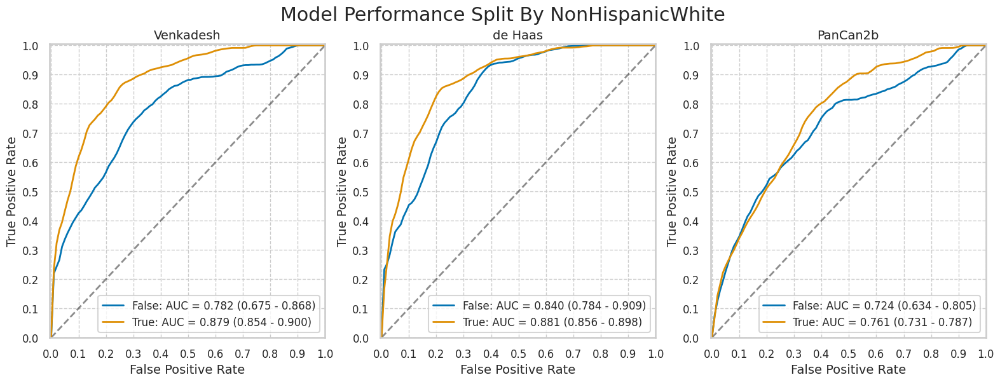

,num,pct,num_mal,pct_mal
False,153,7.419981,29,18.954248
True,1909,92.580019,236,12.362493


In [28]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

,num,pct,num_mal,pct_mal
False,42,2.036857,7,16.666667
True,2020,97.963143,258,12.772277


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,42,5,21,14,2,0.714286,0.60000,0.285714,0.40000,0.192308,0.875000,0.807692,0.125000,0.452381
True,2020,244,816,946,14,0.945736,0.46311,0.054264,0.53689,0.230189,0.985417,0.769811,0.014583,0.589109


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,42,7,25,10,0,1.000000,0.714286,0.000000,0.285714,0.218750,1.000000,0.781250,0.000000,0.404762
True,2020,251,993,769,7,0.972868,0.563564,0.027132,0.436436,0.201768,0.990979,0.798232,0.009021,0.504950


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,42,7,22,13,0,1.000000,0.628571,0.000000,0.371429,0.241379,1.000000,0.758621,0.000000,0.476190
True,2020,233,1043,719,25,0.903101,0.591941,0.096899,0.408059,0.182602,0.966398,0.817398,0.033602,0.471287


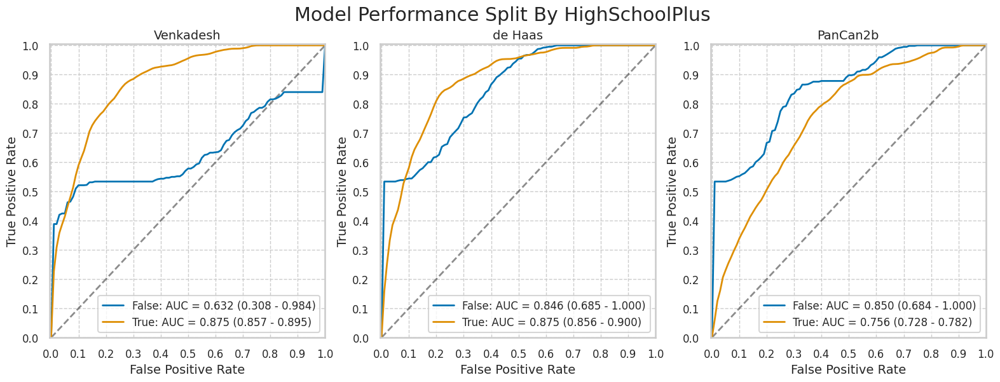

,num,pct,num_mal,pct_mal
False,42,2.036857,7,16.666667
True,2020,97.963143,258,12.772277


In [29]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

,num,pct,num_mal,pct_mal
False,1388,67.313288,175,12.608069
True,674,32.686712,90,13.353116


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1388,165,551,662,10,0.942857,0.454246,0.057143,0.545754,0.230447,0.985119,0.769553,0.014881,0.595821
True,674,84,286,298,6,0.933333,0.489726,0.066667,0.510274,0.227027,0.980263,0.772973,0.019737,0.566766


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1388,171,657,556,4,0.977143,0.541632,0.022857,0.458368,0.206522,0.992857,0.793478,0.007143,0.523775
True,674,87,361,223,3,0.966667,0.618151,0.033333,0.381849,0.194196,0.986726,0.805804,0.013274,0.459941


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1388,160,674,539,15,0.914286,0.555647,0.085714,0.444353,0.191847,0.972924,0.808153,0.027076,0.503602
True,674,80,391,193,10,0.888889,0.669521,0.111111,0.330479,0.169851,0.950739,0.830149,0.049261,0.405045


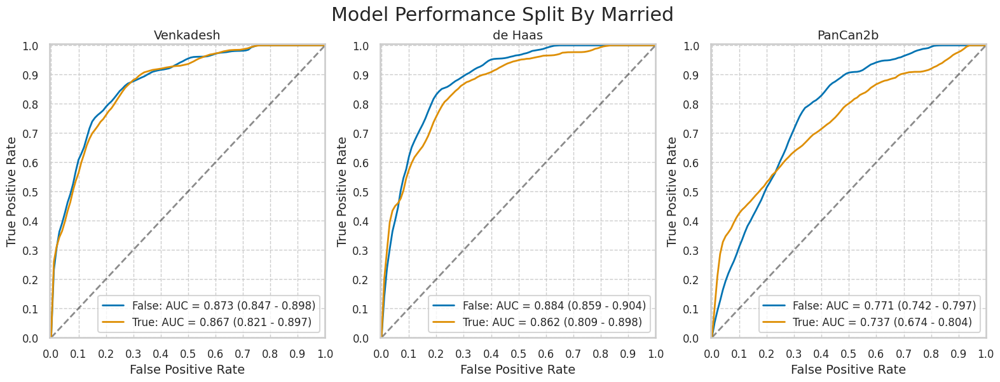

,num,pct,num_mal,pct_mal
False,1388,67.313288,175,12.608069
True,674,32.686712,90,13.353116


In [30]:
married = (nlst_preds['marital'] != 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')